# 📚 Biblioteke

Osnovne biblioteke

In [3]:
import pandas as pd
import numpy as np

Vizualizacija podataka

In [5]:
import seaborn as sns            
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

import plotly.express as px         
import plotly.graph_objects as go
from plotly.subplots import make_subplots 

Duboko učenje

In [7]:
import tensorflow as tf
from tensorflow import keras

Obrada i evaluacija podataka

In [9]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error

# 💾 Dataset

In [11]:
pd.set_option("display.max_colwidth", 120)
sns.set_theme(context="talk", style="whitegrid")

In [12]:
df = pd.read_csv(r"..\data\russia_losses_equipment.csv")
df_corrected = pd.read_csv(r"..\data\russia_losses_equipment_correction.csv")
df_personnel = pd.read_csv(r"..\data\russia_losses_personnel.csv")
df_personnel = df_personnel[["date", "day", "personnel"]]

# Update
df_corrected = df_corrected.drop_duplicates(subset=["day"])
df = df.set_index("day")
df_corrected = df_corrected.set_index("day")
df.update(df_corrected)
df = df.reset_index()

# Add personnel
df = df.merge(df_personnel, on=["date", "day"], how="left")

df = df.sort_values("day").reset_index(drop=True)

# Get numeric columns (excluding day)
numeric_cols = df.select_dtypes(include=["number"]).columns.tolist()
numeric_cols = [c for c in numeric_cols if c not in ["day"]]

# 🔹 Fill missing numeric values with the average of the previous and next value
df[numeric_cols] = df[numeric_cols].apply(
    lambda col: col.interpolate(method="linear", limit_direction="both")
)

# Convert cumulative to daily (diff)
df[numeric_cols] = df[numeric_cols].diff().fillna(df[numeric_cols])
df[numeric_cols] = df[numeric_cols].clip(lower=0)

# # Normalize dtypes for parquet safety
# df = df.convert_dtypes()
# for col in df.select_dtypes(include="object"):
#     df[col] = df[col].astype(str)

df.to_parquet(r"..\data\russia_losses_equipment_final.parquet", engine="pyarrow", index=False)

df

,day,date,aircraft,helicopter,tank,APC,field artillery,MRL,military auto,fuel tank,drone,naval ship,anti-aircraft warfare,special equipment,mobile SRBM system,greatest losses direction,vehicles and fuel tanks,cruise missiles,submarines,personnel
0,2,2022-02-25,10.0,7.0,80.0,516.0,49.0,4.0,100.0,60.0,0.0,2.0,0.0,10.0,2.0,NaN,1796.0,84.0,0.0,2800.0
1,3,2022-02-26,17.0,19.0,66.0,190.0,0.0,0.0,30.0,0.0,2.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,1500.0
2,4,2022-02-27,0.0,0.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,200.0
3,5,2022-02-28,2.0,3.0,0.0,110.0,24.0,17.0,161.0,0.0,1.0,0.0,5.0,0.0,0.0,NaN,0.0,0.0,0.0,800.0
4,6,2022-03-01,0.0,0.0,48.0,30.0,3.0,3.0,14.0,0.0,0.0,0.0,2.0,0.0,0.0,NaN,0.0,0.0,0.0,410.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1307,1309,2025-09-24,2.0,0.0,2.0,3.0,43.0,1.0,0.0,0.0,334.0,0.0,0.0,4.0,0.0,NaN,130.0,0.0,0.0,970.0
1308,1310,2025-09-25,1.0,0.0,0.0,2.0,38.0,5.0,0.0,0.0,415.0,0.0,4.0,2.0,0.0,NaN,120.0,0.0,0.0,940.0
1309,1311,2025-09-26,0.0,0.0,2.0,0.0,14.0,0.0,0.0,0.0,334.0,0.0,0.0,0.0,0.0,NaN,82.0,0.0,0.0,940.0
1310,1312,2025-09-27,0.0,0.0,1.0,1.0,39.0,1.0,0.0,0.0,362.0,0.0,1.0,2.0,0.0,NaN,91.0,0.0,0.0,970.0


**Vremenski okvir**

* **Početak**: 25. februar 2022. (`2022-02-25`)
* **Kraj**: 28. septembar 2025. (`2025-09-28`)
* **Ukupno dana**: 1313 dana
* Svaki red predstavlja **dnevne gubitke** (već je urađen `diff()` nad kumulativnim vrednostima u kodu).

---
**Analiza gubitaka po kategorijama**

| Kategorija                   | Posmatrani uzorci (primeri)                                                                          |
| ---------------------------- | ---------------------------------------------------------------------------------------------------- |
| `aircraft`        | Na početku rata veći gubici (npr. 10, 17), kasnije padaju (0–2)                                      |
| `helicopter`               | Slično kao avioni, pad gubitaka tokom vremena                                                        |
| `tank`                     | Veliki gubici prvih dana (80, 66), a zatim oscilacije (često 0–7)                                    |
| `APC`     | Najveći gubici 516 (prvi dan), a kasnije uglavnom manji brojevi                                      |
| `field artillery`          | Visoki gubici celim tokom (npr. 516, 110, 45...) – intenzivna upotreba                               |
| `MRL` | Uglavnom male vrednosti (0–49) ali stalno prisutni                                                   |
| `military auto`            | Gubici variraju; 100–161 u ranim danima, kasnije blizu nule                                          |
| `fuel tank`                | Veliki gubici prvi dan (60), zatim nula                                                  |
| `drone`                    | Ekstreman rast gubitaka – od 0 na početku, do **454 dnevno** krajem 2025                             |
| `naval ship`               | Retki i mali gubici (0–2); verovatno ograničen broj ciljeva                                          |
| `anti-aircraft warfare`    | Gubici su povremeni (0–5), bez velikih skokova                                                       |
| `special equipment`        | Povremeni gubici, npr. 10 na početku, pa zatim niže vrednosti                                        |
| `mobile SRBM system`       | Veoma retki gubici (uglavnom 0)                                                                      |
| `personnel`                | Vrlo visoki prvi dan (2800), zatim pada na 1500, pa nisko (200, 800...) i blagi rast u 2025. do 1110 |

In [14]:
# Print number of rows and columns
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")
print(f"Number of duplicate rows: {df.duplicated().sum()}")

Number of rows: 1312
Number of columns: 20
Number of duplicate rows: 0


In [15]:
for col in df.columns:
    print(f"col name: {col}")
    print(f"col type: {df[col].dtype}")
    print(f"values example: {df[col].unique()[:5]}\n")

col name: day
col type: int64
values example: [2 3 4 5 6]

col name: date
col type: object
values example: ['2022-02-25' '2022-02-26' '2022-02-27' '2022-02-28' '2022-03-01']

col name: aircraft
col type: float64
values example: [10. 17.  0.  2.  1.]

col name: helicopter
col type: float64
values example: [ 7. 19.  0.  3.  2.]

col name: tank
col type: float64
values example: [80. 66.  4.  0. 48.]

col name: APC
col type: float64
values example: [516. 190.   0. 110.  30.]

col name: field artillery
col type: float64
values example: [49.  0.  1. 24.  3.]

col name: MRL
col type: float64
values example: [ 4.  0. 17.  3. 16.]

col name: military auto
col type: float64
values example: [100.  30.   0. 161.  14.]

col name: fuel tank
col type: float64
values example: [60.  0. 10.  2.  1.]

col name: drone
col type: float64
values example: [0. 2. 1. 3. 5.]

col name: naval ship
col type: float64
values example: [ 2.  0.  1. 15. 18.]

col name: anti-aircraft warfare
col type: float64
values exa

In [16]:
# Print percentage of missing values per column
for col in df.columns:
    missing_percentage = df[col].isnull().mean() * 100
    print(f"{col}: {missing_percentage:.2f}% missing values")

day: 0.00% missing values
date: 0.00% missing values
aircraft: 0.00% missing values
helicopter: 0.00% missing values
tank: 0.00% missing values
APC: 0.00% missing values
field artillery: 0.00% missing values
MRL: 0.00% missing values
military auto: 0.00% missing values
fuel tank: 0.00% missing values
drone: 0.00% missing values
naval ship: 0.00% missing values
anti-aircraft warfare: 0.00% missing values
special equipment: 0.00% missing values
mobile SRBM system: 0.00% missing values
greatest losses direction: 84.53% missing values
vehicles and fuel tanks: 0.00% missing values
cruise missiles: 0.00% missing values
submarines: 0.00% missing values
personnel: 0.00% missing values


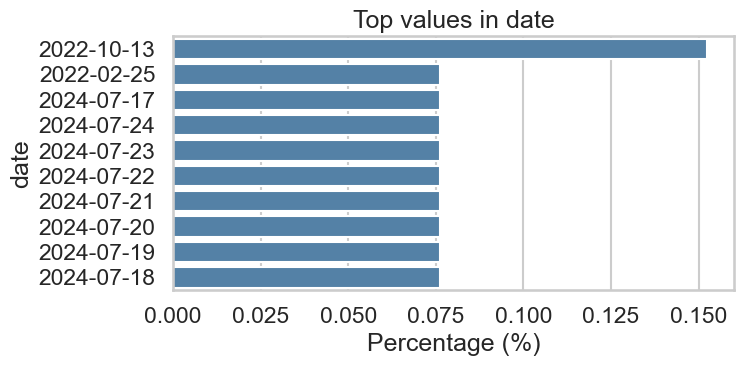

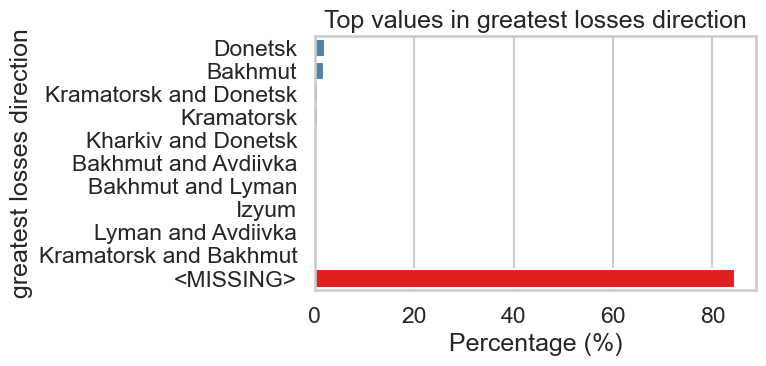

In [17]:
for col in df.select_dtypes(include="object"):
    # Top 10 + missing %
    counts = df[col].value_counts(dropna=True).head(10)
    counts = counts / len(df) * 100

    missing = df[col].isna().sum()
    if missing > 0:
        counts["<MISSING>"] = (missing / len(df)) * 100

    # Build a DataFrame for seaborn
    plot_df = counts.reset_index()
    plot_df.columns = [col, "Percentage"]

    # Define colors
    color_map = {v: "red" if v == "<MISSING>" else "steelblue" for v in plot_df[col]}

    plt.figure(figsize=(8, 4))
    ax = sns.barplot(
        data=plot_df,
        y=col,
        x="Percentage",
        hue=col,
        palette=color_map,
        orient="h",
        dodge=False,
        legend=False
    )

    ax.set_title(f"Top values in {col}")
    ax.set_xlabel("Percentage (%)")
    ax.set_ylabel(col)
    plt.tight_layout()
    plt.show()

#### Top values in date

* **Najveća vrednost** je zabeležena 13. oktobra **2022.** godine i iznosi približno **15%**.
* Svi ostali datumi na listi (od 17. jula 2024. do 18. jula 2024.) imaju veoma slične vrednosti, koje su takođe oko **7.5%**. Zanimljivo je da su datumi iz **jula 2024.** godine (uključujući sedam uzastopnih dana) identični po vrednosti onom iz februara 2024.

Ovaj grafikon ističe da se najveći špic (skoro dvostruko veći od sledeće) desila u **oktobru 2022.** godine, dok su ostale vrednosti mnogo niže i uniformnije.

---
#### Top values in greatest losses direction

* **Dominantna vrednost** je označena sa `<MISSING>` i iznosi **preko 80%**. Ovo je ubedljivo najveći procenat u celom grafikonu. Budući da je vrednost označena kao nedostajuća, ona ukazuje da ogromna većina podataka potiče iz nepoznatog ili neklasifikovanog pravca.
* Sve ostale lokacije (Donetsk, Bakhmut, Kramatorsk and Donetsk, Kramatorsk, itd.) imaju **izuzetno niske procente**.
    * **Donetsk** ima najveći procenat od svih imenovanih lokacija, ali je i dalje minimalan.
    * **Bakhmut** i ostale kombinacije pravaca (npr. Kharkiv and Donetsk, Lyman and Avdiivka) imaju zanemarljive procente koji se jedva vide.
---

> Grafikon snažno sugeriše da je za **preko 80%** ukupnih vrednosti (verovatno gubitaka) **nedostaje informacija o geografskom pravcu**. Svi navedeni i poznati pravci čine manje od 20% ukupne vrednosti.

> 1.  **Vremenska analiza** pokazuje jedan veliki pik u oktobru 2022., dok su vrednosti iz jula 2024. (i februara 2024.) stabilnije i niže.

> 2.  **Geografska analiza** ukazuje na veliki **problem sa klasifikacijom ili dostupnošću podataka**, jer je pravac najvećih gubitaka u preko 80% slučajeva nepoznat.

# 💡 Deskriptivna analiza

In [20]:
# Print for each numeric column mean, median, std, min, max, quantiles
for col in df.select_dtypes(include="number"):
    print(f"{col}:")
    print(f"  Mean: {df[col].mean():,.2f}")
    print(f"  Median: {df[col].median():,.2f}")
    print(f"  Std: {df[col].std():,.2f}")
    print(f"  Min: {df[col].min():,.2f}")
    print(f"  Max: {df[col].max():,.2f}")
    print(f"  25th percentile: {df[col].quantile(0.25):,.2f}")
    print(f"  50th percentile: {df[col].quantile(0.50):,.2f}")
    print(f"  75th percentile: {df[col].quantile(0.75):,.2f}")

day:
  Mean: 657.50
  Median: 657.50
  Std: 378.89
  Min: 2.00
  Max: 1,313.00
  25th percentile: 329.75
  50th percentile: 657.50
  75th percentile: 985.25
aircraft:
  Mean: 7.12
  Median: 0.00
  Std: 48.92
  Min: 0.00
  Max: 372.00
  25th percentile: 0.00
  50th percentile: 0.00
  75th percentile: 0.00
helicopter:
  Mean: 6.42
  Median: 0.00
  Std: 44.27
  Min: 0.00
  Max: 335.00
  25th percentile: 0.00
  50th percentile: 0.00
  75th percentile: 0.00
tank:
  Mean: 166.17
  Median: 7.00
  Std: 1,165.54
  Min: 0.00
  Max: 10,761.00
  25th percentile: 3.00
  50th percentile: 7.00
  75th percentile: 12.00
APC:
  Mean: 332.43
  Median: 14.00
  Std: 2,337.81
  Min: 0.00
  Max: 22,401.00
  25th percentile: 7.00
  50th percentile: 14.00
  75th percentile: 24.00
field artillery:
  Mean: 347.38
  Median: 21.00
  Std: 2,487.10
  Min: 0.00
  Max: 27,329.00
  25th percentile: 7.00
  50th percentile: 21.00
  75th percentile: 39.00
MRL:
  Mean: 22.59
  Median: 1.00
  Std: 157.35
  Min: 0.00
  Max: 

**Opšti utisci**

* **`day`**: S obzirom da je **medijana dana 657.5**, verovatno imamo podatke za **oko 657 dana**. Ovo ukazuje na period duži od 1,5 godine.
* **Distribucija**: Za mnoge kategorije, podaci su **veoma asimetrični** (visoka srednja vrednost, ali medijana 0) – što implicira da su visoki gubici retki, ali ekstremni kada se dese (npr. “aircraft”, “tank”, “drone”).
* **Standardne devijacije** su često znatno veće od srednjih vrednosti → **distribucije su ekstremno razbacane**, što ukazuje na neredovne i povremene velike događaje (npr. udari, bitke).

---
**`personnel`**

* **`personnel`**:

  * *Mean*: 844.9
  * *Median*: 860 → vrlo ujednačeno, što ukazuje na **konzistentne dnevne gubitke ljudstva**.
  * *Std*: 433.82 → ipak postoji oscilacija (intenzivnije borbe u nekim danima).
  * *Min/Max*: od 0 do 3,160.
  * *Zaključak*: Gubici ljudstva su stabilni, ali uz dane sa značajnim skokovima.

---
**Vazduhoplovstvo**

* **`aircraft` & `helicopter`**:

  * *Mean*: ~7 i ~6, *Median*: 0, *75th percentile*: 0 → **retki, ali ponekad masovni gubici**.
  * *Max*: 372 (aircraft), 335 (helicopter).
  * *Zaključak*: Avijacija se gubi povremeno i u klasterima – moguće tokom velikih ofanziva ili zbog protivvazdušnih sistema.

* **`drones`**:

  * *Mean*: 355, *Median*: 18 → znatno češći gubici u poređenju sa pilotiranim letelicama.
  * *Max*: 34,965 → neverovatan maksimum, verovatno anomalija ili specijalni događaj.
  * *Zaključak*: Dronovi su intenzivno korišćeni i često gubici prelaze stotine dnevno.

---
**Kopnena tehnika**

* **`tank` / `APC` / `field artillery` / `MRL`**:

  * *Tank Mean*: 166, ali *Median*: 7 → ekstremna asimetrija. *Max*: 10,761 (!).
  * *Artillery Mean*: 347, *Median*: 21 → i ovde postoji sličan obrazac.
  * *MRL Mean*: 22.6, *Median*: 1 → mnogo ređi.
  * *Zaključak*: Veoma povremeno, ali kataklizmično gubici (možda dani kada se broji ukupna brojka iz dužeg perioda ili greške).

---
**Vozila i gorivo**

* **`vehicles and fuel tanks`**:

  * *Mean*: 520.67, *Median*: 29 → opet ekstremna razlika, *Max*: 47,241 (!).
  * *Zaključak*: Ova kategorija uključuje mnogo toga – verovatno logistička vozila, pa su veći brojevi realni, ali i neujednačeni.

* **`fuel tanks` / `military auto`**:

  * *Median*: 0, *Mean*: vrlo nisko → retko se gube samostalno.

---
**Pomorske snage**

* **`naval ships` / `submarines`**:

  * *Mean i Median*: skoro 0.
  * *Max ship*: 28, *submarine*: 1 → verovatno pojedinačni događaji.
  * *Zaključak*: Pomorske operacije su retke i gubici minimalni.

---
**Naoružanje i specijalna oprema**

* **`anti-aircraft warfare` / `special equipment`**:

  * *Mean*: nisko u odnosu na *Max*, *Median*: 0.
  * *Zaključak*: Retko, ali ponekad dolazi do većih gubitaka specijalne opreme – možda u preciznim udarima ili ofanzivama.

* **`cruise missiles`**:

  * *Mean*: 48, *Median*: 0 → nisu korišćeni svakodnevno, ali u danima kada jesu, broj je visok.
  * *Max*: 3,197 → verovatno dan masovnog raketnog napada.

---
Većina kategorija ima *max* vrednosti koje su **nenormalno visoke** u odnosu na 75. percentil, verovatno outlier-i.

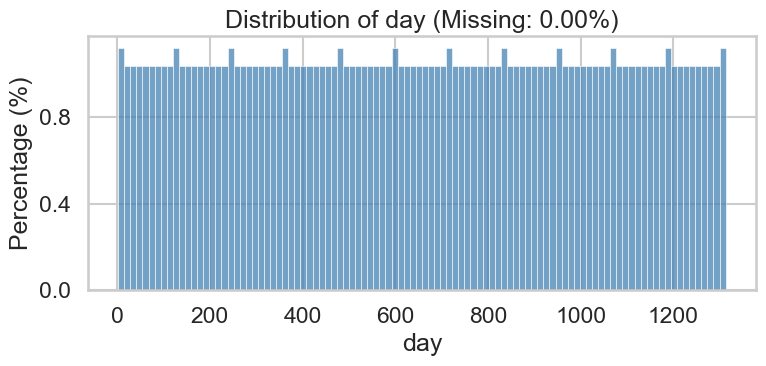

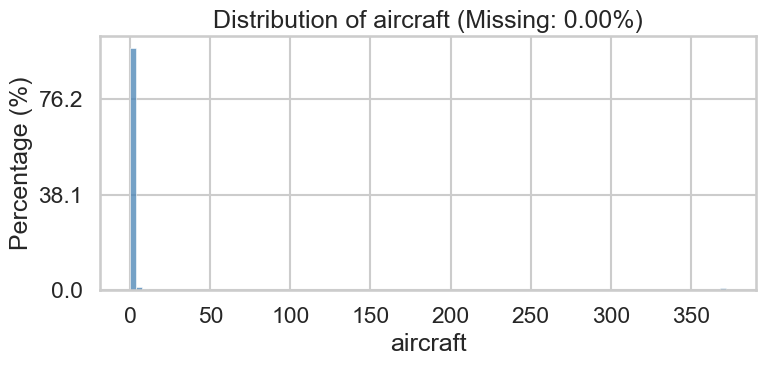

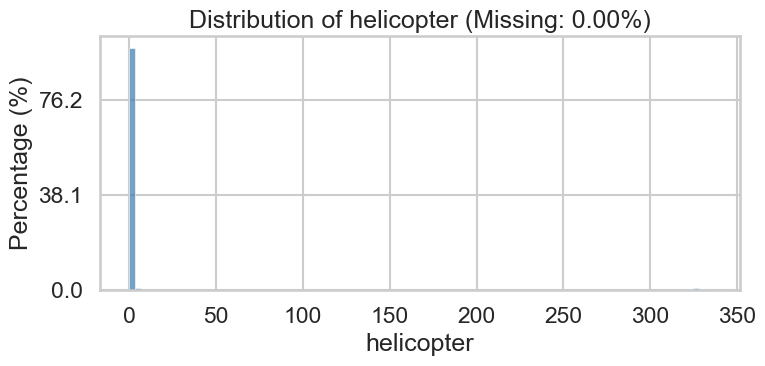

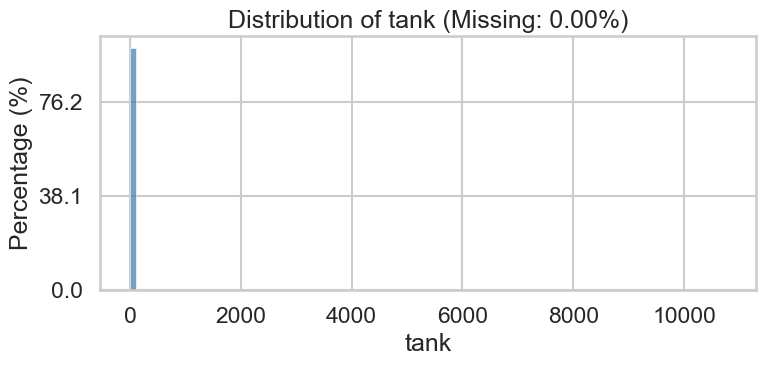

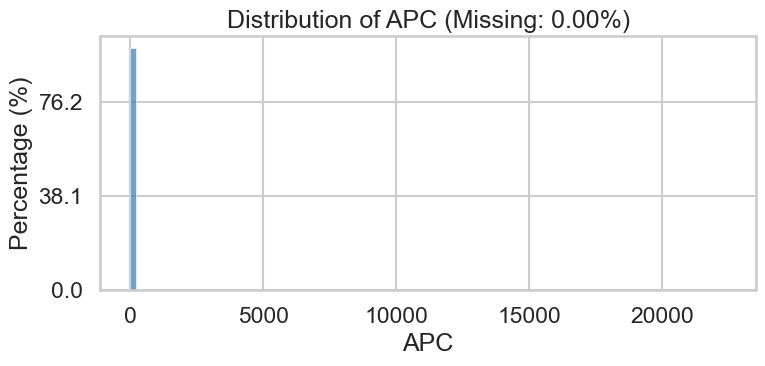

...

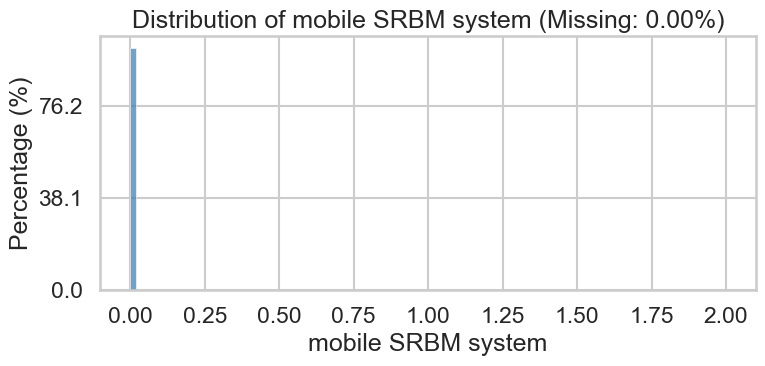

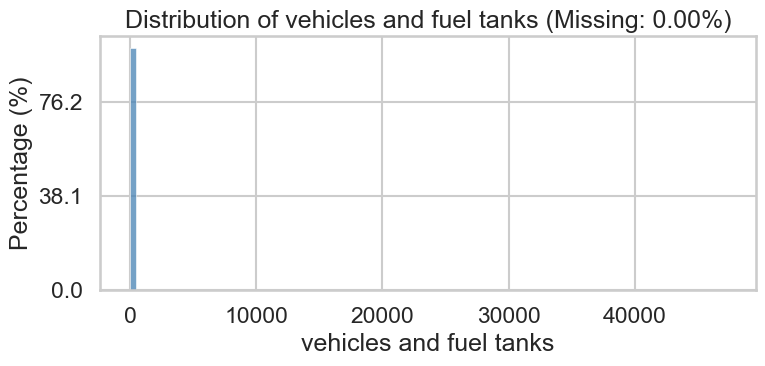

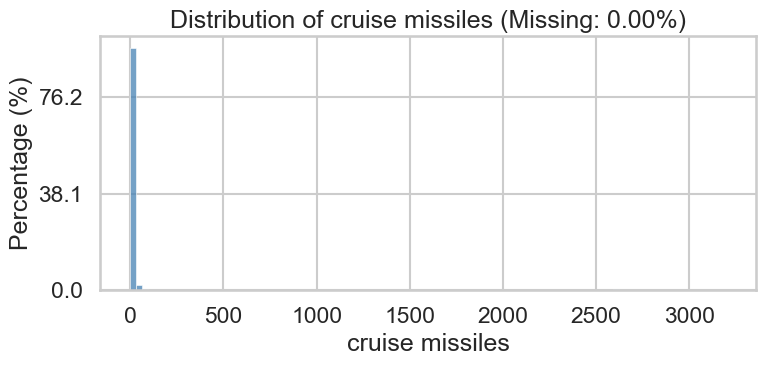

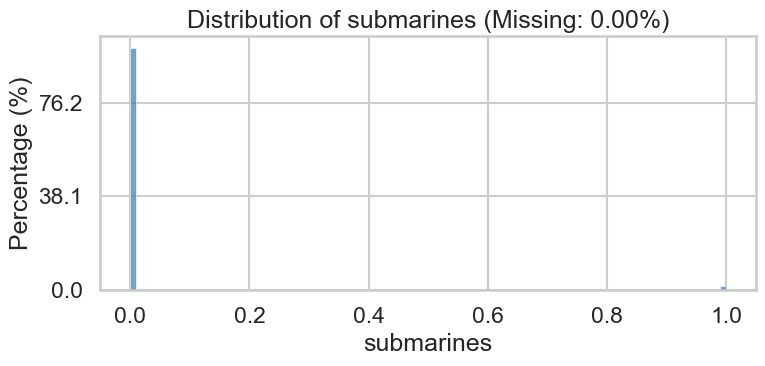

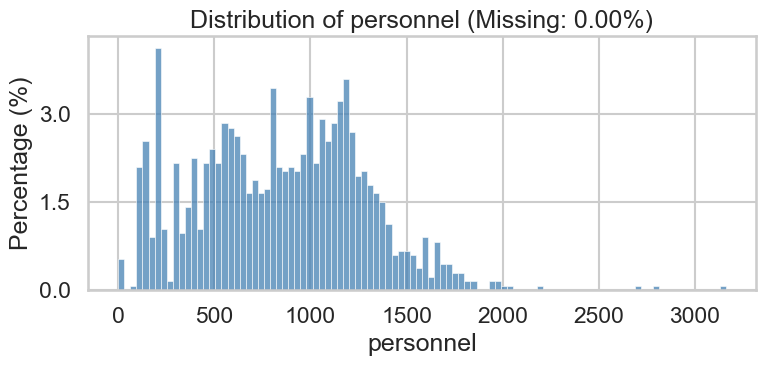

In [22]:
# For each numeric column, plot histogram with percentage on y-axis
for col in df.select_dtypes(include="number"):
    s = df[col]
    total = len(s)
    missing_pct = s.isna().mean() * 100

    plt.figure(figsize=(8, 4))
    ax = sns.histplot(
        s.dropna(),
        bins=100,
        stat="count",      # raw counts, we'll format y-axis
        color="steelblue",
        edgecolor=None
    )

    # Show y-axis as % of total rows
    ax.yaxis.set_major_formatter(
        FuncFormatter(lambda y, _: f"{(y/total)*100:.1f}")
    )

    ax.set_title(f"Distribution of {col} (Missing: {missing_pct:.2f}%)")
    ax.set_xlabel(col)
    ax.set_ylabel("Percentage (%)")

    plt.tight_layout()
    plt.show()

| Kolona | Kratka Analiza Distribucije |
| :--- | :--- |
| `day` | **Uniformna (ravnomerna) distribucija** sa stubićima približno jednake visine, što ukazuje na ravnomernu raspoređenost tokom vremena. |
| `personnel` | **Desno-asimetrična** distribucija, sa koncentracijom oko 250-1500 i dugim repom ka većim vrednostima. Vrednosti nisu koncentrisane na nuli. |
| `drone` | **Izuzetno desno-asimetrična**, sa ogromnim procentom posmatranja koncentrisanim na nuli. Tipično za retke događaje/brojeve. |
| `naval ship` | **Izuzetno desno-asimetrična**, sa skoro svim podacima koncentrisanim na nuli ili blizu nje (vrednosti do 30). |
| `anti-aircraft warfare` | **Izuzetno desno-asimetrična**, sa skoro svim podacima koncentrisanim na nuli (vrlo uski opseg). |
| `aircraft` | **Izuzetno desno-asimetrična**, sa masivnim pikom na nuli. |
| `helicopter` | **Izuzetno desno-asimetrična**, sa masivnim pikom na nuli. |
| `tank` | **Izuzetno desno-asimetrična**, sa masivnim pikom na nuli. |
| `APC` | **Izuzetno desno-asimetrična**, sa masivnim pikom na nuli. |
| `field artillery` | **Izuzetno desno-asimetrična**, sa masivnim pikom na nuli. |
| `MRL` | **Izuzetno desno-asimetrična**, sa masivnim pikom na nuli. |
| `military auto` | **Izuzetno desno-asimetrična**, sa masivnim pikom na nuli. |
| `fuel tank` | **Izuzetno desno-asimetrična**, sa masivnim pikom na nuli. |
| `cruise missiles` | **Izuzetno desno-asimetrična**, sa masivnim pikom na nuli. |
| `submarines` | **Izuzetno desno-asimetrična**, sa masivnim pikom na nuli (raspon od 0 do 1). |
| `special equipment` | **Izuzetno desno-asimetrična**, sa masivnim pikom na nuli. |
| `mobile SRBM system` | **Izuzetno desno-asimetrična**, sa masivnim pikom na nuli (raspon od 0 do 2). |
| `vehicles and fuel tanks` | **Izuzetno desno-asimetrična**, sa masivnim pikom na nuli. |

In [24]:
def plot_loss_overview(df: pd.DataFrame, feature: str):
    """
    Plot a 2x2 overview of losses for a given feature:
    1) Daily losses
    2) Weekly losses
    3) Monthly losses
    4) Cumulative losses

    Parameters
    ----------
    df : pd.DataFrame
        DataFrame with at least 'date' and the selected feature column.
    feature : str
        Name of the numeric column to plot.
    """
    # --- Ensure datetime ---
    if "date" not in df.columns:
        raise ValueError("DataFrame must contain a 'date' column.")
    df = df.copy()
    df["date"] = pd.to_datetime(df["date"])
    
    if feature not in df.columns:
        raise ValueError(f"Column '{feature}' not found in DataFrame.")
    
    # --- Prepare aggregations ---
    daily_df = df[["date", feature]].copy()

    weekly_df = (
        df.set_index("date")[feature]
          .resample("W")
          .sum()
          .reset_index()
    )

    monthly_df = (
        df.set_index("date")[feature]
          .resample("ME")
          .sum()
          .reset_index()
    )

    cumulative_df = daily_df.copy()
    cumulative_df["cumulative"] = cumulative_df[feature].cumsum()

    # --- Create 2×2 subplot grid ---
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=(
            f"Daily {feature.title()} Losses",
            f"Weekly {feature.title()} Losses",
            f"Monthly {feature.title()} Losses",
            f"Cumulative {feature.title()} Losses",
        )
    )

    # 1️⃣ Daily
    fig.add_trace(
        go.Scatter(
            x=daily_df["date"], y=daily_df[feature],
            mode="lines+markers", name="Daily"
        ),
        row=1, col=1
    )

    # 2️⃣ Weekly
    fig.add_trace(
        go.Scatter(
            x=weekly_df["date"], y=weekly_df[feature],
            mode="lines+markers", name="Weekly", line=dict(color="orange")
        ),
        row=1, col=2
    )

    # 3️⃣ Monthly
    fig.add_trace(
        go.Scatter(
            x=monthly_df["date"], y=monthly_df[feature],
            mode="lines+markers", name="Monthly", line=dict(color="green")
        ),
        row=2, col=1
    )

    # 4️⃣ Cumulative
    fig.add_trace(
        go.Scatter(
            x=cumulative_df["date"], y=cumulative_df["cumulative"],
            mode="lines", name="Cumulative", line=dict(color="red")
        ),
        row=2, col=2
    )

    # --- Layout formatting ---
    fig.update_layout(
        height=800, width=1100,
        title_text=f"{feature.title()} Losses Overview (Daily → Cumulative)",
        showlegend=False,
        template="plotly_white",
    )

    # Axis titles
    for i in range(1, 5):
        fig["layout"][f"xaxis{i}"].update(title="Date")
        fig["layout"][f"yaxis{i}"].update(title="Losses")

    fig.show()

plot_loss_overview(df, "tank")
plot_loss_overview(df, "aircraft")
plot_loss_overview(df, "helicopter")
plot_loss_overview(df, "drone")
plot_loss_overview(df, "personnel")

**Personnel Losses**

* **Dnevni gubici:** Prikazuju značajan **porast** sa vremenom. Počevši od niskih vrednosti u 2022. godini, dnevni gubici su se stabilizovali na višem nivou, pokazujući **opšti trend rasta** kroz 2023. i 2024. godinu, sa vrhuncima blizu 3000 krajem 2024. i početkom 2025. godine. U kasnijem periodu blago opadaju, ali ostaju na višem nivou.
* **Nedeljni gubici:** Prate isti trend, pokazujući **stalni rast** od 2022. do 2024. godine, dostižući svoj **najveći vrhunac (preko 12.000)** početkom 2025. godine, nakon čega sledi blagi pad.
* **Mesečni gubici:** Oslikavaju jasan **uzlazni trend** tokom 2022. i 2023. godine, sa vrhuncima oko **45.000 do 50.000** u 2024/2025. godini, praćeno opadanjem.
* **Kumulativni gubici:** Pokazuju **konstantno ubrzan rast**. Kriva je strma, dostižući **preko 1.000.000** gubitaka do kraja posmatranog perioda.

---
**Tank Losses**

* **Dnevni, Nedeljni i Mesečni gubici:** Karakteriše ih **visoka varijabilnost (nestabilnost)**. Vidljivi su periodi ekstremno visokih gubitaka koji se presecaju sa periodima blizu nule, naročito u dnevnim i nedeljnim gubicima. Mesečni gubici pokazuju **naglo povećanje učestalosti i magnitude** od kraja 2023. do 2025. godine, sa vrhovima koji prelaze 30.000.
* **Kumulativni gubici:** Kriva je **stepenasta**, sa **veoma oštrim usponima** koji se dešavaju kasno u 2024. godini, što ukazuje na nagle i velike kampanje gubitaka u tom periodu. Ukupni gubici dostižu **preko 200.000**.

---
**Drone Losses**

* **Dnevni, Nedeljni i Mesečni gubici:** Pokazuju **ekstremni trend rasta**. Gubitak dronova je bio minimalan ili spor do 2024. godine, a zatim se **naglo povećao u frekvenciji i veličini**. Dnevni gubici dostižu **preko 30.000**, a mesečni gubici dostižu **preko 60.000** pred kraj posmatranog perioda.
* **Kumulativni gubici:** Kriva je skoro **vertikalna** od kraja 2023. i tokom 2024. godine, što ukazuje na **eksplozivni rast** upotrebe i gubitka dronova. Ukupni gubici dostižu **preko 400.000**.

---
**Aircraft & Helicopter Losses**

Gubici letelica i helikoptera pokazuju **vrlo sličan obrazac** visokih, diskretnih skokova, karakterističnih za sporadične, ali velike incidente.

* **Dnevni gubici:** Dominiraju **vrlo visoki vertikalni pikovi** (do oko 350 za letelice i helikoptere), praćeni dužim periodima nultih ili vrlo niskih gubitaka. Ovo sugeriše da su gubici bili **koncentrisani** u određene kratke periode.
* **Mesečni gubici:** Pokazuju **nepravilne skokove** (vrhovi oko 1500 za letelice i 1000 za helikoptere), bez jasnog dugoročnog trenda rasta. Varijabilnost je izražena.
* **Kumulativni gubici:** Kriva raste **stepenasto**, sa horizontalnim platoima i naglim, vertikalnim skokovima. Rast se usporava i **stabilizuje (plato)** na kraju posmatranog perioda, oko **8.000+** za obe kategorije.

In [26]:
def plot_moving_avg_and_momentum(df: pd.DataFrame, feature: str):
    """
    Plot daily losses with 7-day and 30-day moving averages,
    and rate of change (momentum) as a secondary subplot.

    Parameters
    ----------
    df : pd.DataFrame
        Must contain 'date' and the selected feature.
    feature : str
        Numeric column name to analyze.
    """
    if "date" not in df.columns:
        raise ValueError("DataFrame must contain a 'date' column.")
    if feature not in df.columns:
        raise ValueError(f"Column '{feature}' not found in DataFrame.")
    
    df = df.copy()
    df["date"] = pd.to_datetime(df["date"])
    
    # --- Compute moving averages and momentum ---
    df["MA_7"] = df[feature].rolling(7).mean()
    df["MA_30"] = df[feature].rolling(30).mean()
    df["Momentum"] = df[feature].pct_change() * 100  # % change (rate of change)
    
    # --- Create figure with two rows ---
    fig = make_subplots(
        rows=1, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.12,
        subplot_titles=(
            f"{feature.title()} Losses with 7D & 30D Moving Averages",
            f"{feature.title()} Momentum (% Change per Day)"
        )
    )

    # 1️⃣ Top plot: raw + moving averages
    fig.add_trace(go.Scatter(
        x=df["date"], y=df[feature],
        mode="lines", name="Daily Losses",
        line=dict(color="steelblue", width=1)
    ), row=1, col=1)

    fig.add_trace(go.Scatter(
        x=df["date"], y=df["MA_7"],
        mode="lines", name="7-day MA",
        line=dict(color="orange", width=2)
    ), row=1, col=1)

    fig.add_trace(go.Scatter(
        x=df["date"], y=df["MA_30"],
        mode="lines", name="30-day MA",
        line=dict(color="green", width=2, dash="dash")
    ), row=1, col=1)

    # Axis titles
    fig.update_xaxes(title_text="Date", row=2, col=1)
    fig.update_yaxes(title_text="Losses", row=1, col=1)

    fig.show()

plot_moving_avg_and_momentum(df, "personnel")

**Opšti trend**

* **Jasan uzlazni trend:** Od početka 2022. do početka 2025. godine, gubici pokazuju **jasan i stalan trend rasta**. Pokretni proseci (i 7D i 30D) se postepeno povećavaju sa osnovnog nivoa od oko 200-300 na početku 2022. godine do najvišeg nivoa od **oko 1800-2000** u proleće 2025. godine.
* **Period stagnacije/pada:** Od proleća 2025. godine, trend se menja, pokazujući **blagi pad** nivoa gubitaka. Do kraja posmatranog perioda, pokretni proseci se stabilizuju na nivou od **oko 900-1000**.

---
**Analiza varijabilnosti**

* **Visoka dnevna varijabilnost:** Plava linija ("Daily Losses") pokazuje **visoku dnevnu varijabilnost** tokom celog perioda, sa šiljcima koji često dostižu 2000, a povremeno i preko 3000 (npr., početak 2022. i proleće 2025.). Ovo ukazuje da se gubici dešavaju u **intenzivnim udarnim periodima**.
* **Efekat proseka:**
    * **7D MA (Narandžasta linija):** Ova linija je **osetljivija** na kratkoročne fluktuacije i stoga prati dnevne gubitke sa malim zaostajanjem, efikasno izglađujući ekstremne dnevne vrhunce i padove.
    * **30D MA (Zelena isprekidana linija):** Ova linija je **najglatkija** jer izglađuje i nedeljne oscilacije. Ona najbolje predstavlja **dugoročni, osnovni trend** u toku sukoba.

---
**Ključni periodi**

1.  **Početni period (Rano 2022.):** Karakteriše ga **izuzetno visok inicijalni skok** (preko 3000), nakon čega sledi nagli pad i stabilizacija na nižem nivou.
2.  **Period rasta (Jul 2022. - Jan 2025.):** Gotovo **kontinuirani, postepeni rast** prosečnog broja gubitaka. Tokom 2024. godine, nivoi se stabilizuju na visokom platou (oko 1200-1500), sa čestim dnevnim vrhuncima.
3.  **Vrhunac (Proleće 2025.):** Pokretni proseci dostižu svoj **maksimum**, što ukazuje na najintenzivniji period borbe u smislu prosečnog dnevnog gubitka.
4.  **Period opadanja (Nakon Proleća 2025.):** Beleži se **jasan silazni trend** u pokretnim prosečima, koji se spuštaju i stabilizuju na srednjem nivou.

> Gubici osoblja, gledano kroz proseke, pokazali **jasan eskalacioni trend tokom dve godine**, dostižući vrhunac početkom 2025. godine, nakon čega je usledilo **značajno, ali ne i potpuno, smanjenje** intenziteta.

In [28]:
features = ["personnel", "tank", "aircraft", "helicopter", "drone", "fuel tank"]

fig = px.scatter_matrix(
    df,
    dimensions=features,
    title="Scatter Matrix of Key Loss Categories",
    height=800,
    color="personnel",
    color_continuous_scale="Reds"
)
fig.update_traces(diagonal_visible=False)
fig.show()

**Analiza odnosa između `personnel` i ostalih kategorija**

* `personnel` vs. `tank`: Postoji **umerena pozitivna korelacija** sa izraženom grupom tačaka koje se kreću dijagonalno ka gore i desno. Viši gubici tenkova obično se dešavaju kada su i gubici osoblja viši. Međutim, postoji i veliki broj slučajeva niskih gubitaka tenkova pri širokom rasponu gubitaka osoblja.
* `personnel` vs. `drone`: Pokazuje **jasnu pozitivnu nelinearnu (eksponencijalnu) korelaciju**. Kako gubici osoblja rastu, gubici dronova dramatično rastu, posebno pri višim nivoima gubitaka osoblja. Tačke su koncentrisane na dnu i protežu se u desno.
* `personnel` vs. `aircraft`/`helicopter`/`fuel tank`: Ovi odnosi su **slabi i disperzovani**. Gubici letelica i helikoptera su koncentrisani u vrlo uskim opsezima (uglavnom ispod 100), što otežava uočavanje snažnog trenda. Većina gubitaka osoblja dešava se bez gubitka ovih stavki, a visoki gubici osoblja se dešavaju i pri nultim gubicima letelica/helikoptera.

---
**Equipment Correlations**

* `tank` vs. `drone`: Postoji **veoma jaka, nelinearna pozitivna korelacija**. Pri malim gubicima tenkova, gubici dronova su niski, ali kada gubici tenkova porastu, gubici dronova se **eksponencijalno** povećavaju (kriva koja se savija nagore). To ukazuje na to da su veće ofanzivne operacije (sa velikim gubicima tenkova) praćene masovnom upotrebom (i gubitkom) dronova.
* `aircraft` vs. `helicopter`: Pokazuje **umerenu do jaku pozitivnu korelaciju**. Tačke su prilično blizu dijagonalne linije, što sugeriše da se gubici letelica i helikoptera često dešavaju istovremeno.

---
**Analiza Fuel Tank**

* `fuel tank` vs. Sve ostalo: Korelacija između rezervoara za gorivo i svih ostalih kategorija je **veoma slaba**. Tačke su uglavnom koncentrisane blizu nule i vertikalne ose, što ukazuje da su gubici rezervoara za gorivo sporadični i **ne zavise značajno** od dnevnih gubitaka u glavnim kategorijama (osoblje, tenkovi, letelice), osim nekoliko retkih incidenata koji su se dogodili na dan sa visokim gubicima osoblja/tenkova.

---
> **Najjča korelacija** je između **Tenkova i Dronova** (visoki gubici tenkova su gotovo uvek praćeni visokim gubicima dronova).

> Gubici **Osoblja** su najviše povezani sa gubicima **Tenkova** i **Dronova**.

> Gubici **Avijacije (Aircraft i Helicopter)** su relativno **nezavisni** od dnevnih fluktuacija u ostalim kategorijama, dešavajući se u uskim, diskretnim grupama.+

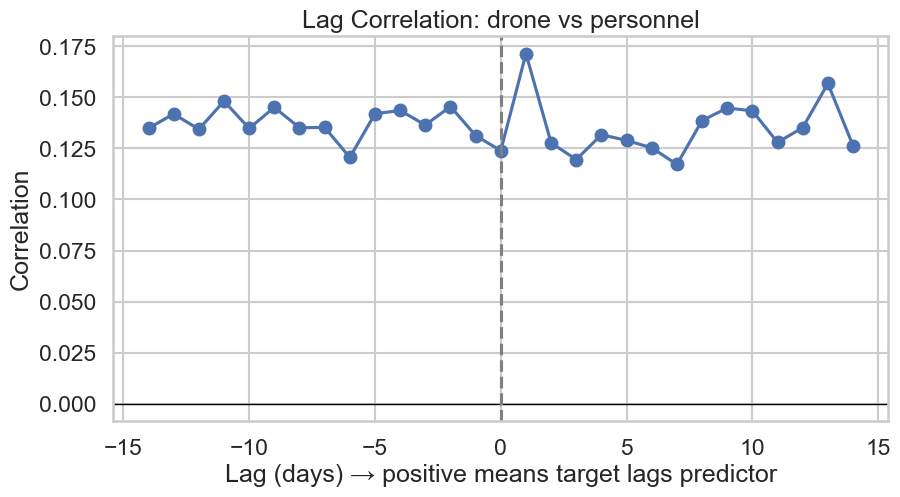

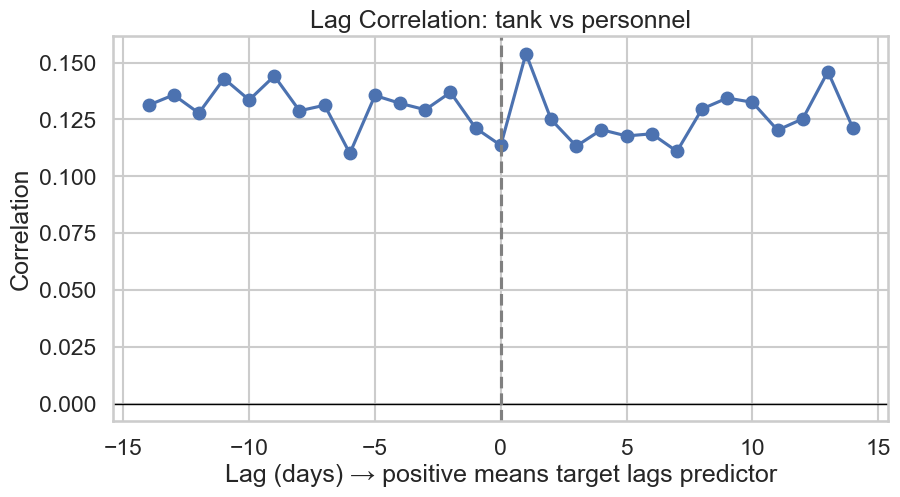

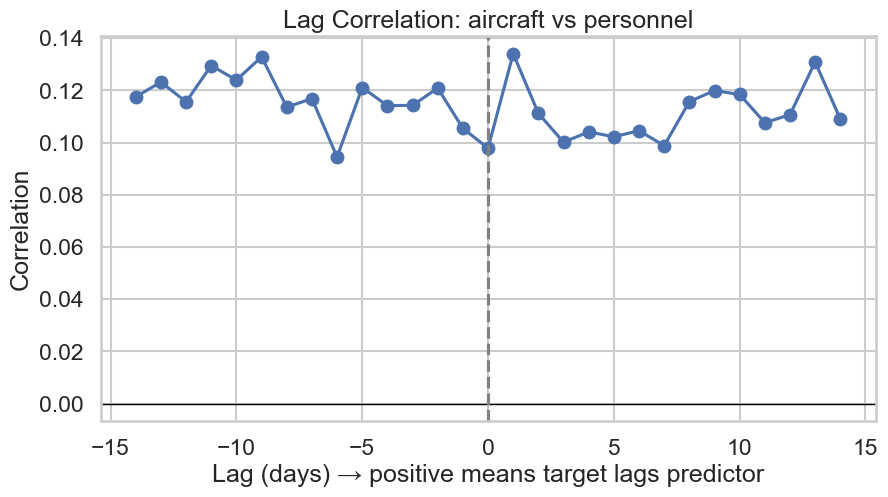

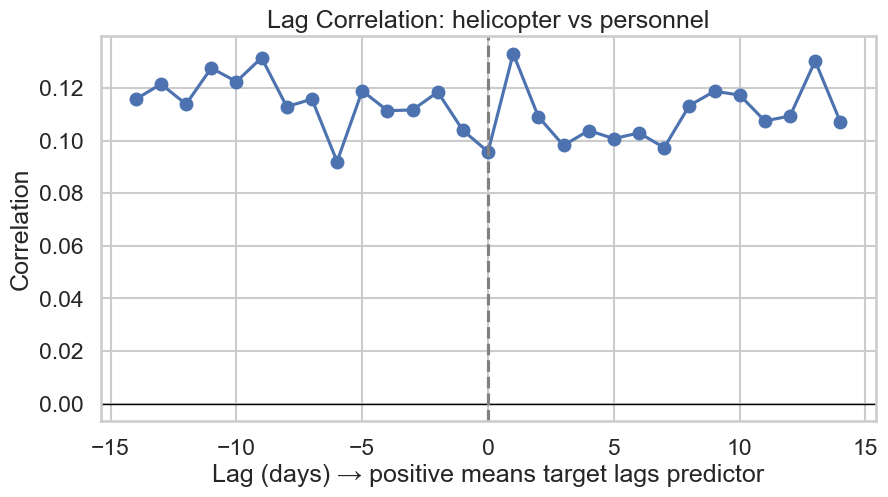

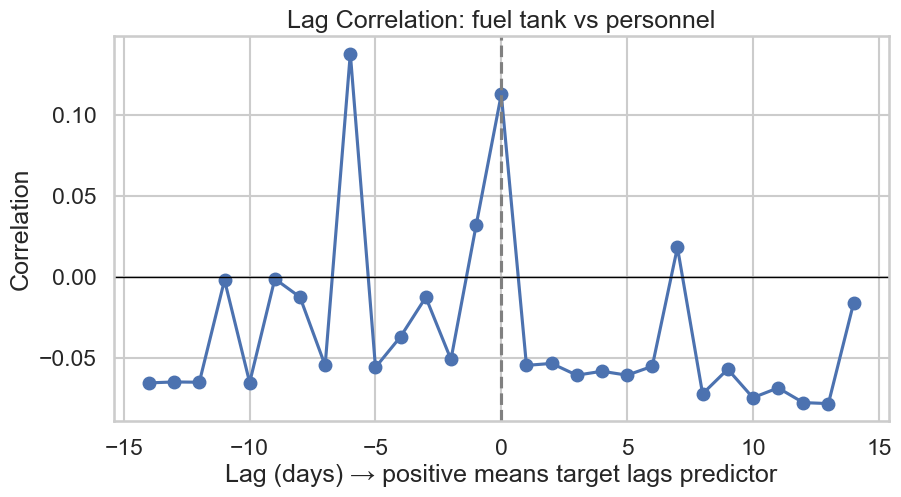

In [30]:
def plot_lag_correlation(df, x_col, y_col, max_lag=14):
    """Compute and plot lag correlation between x and y."""
    correlations = []
    for lag in range(-max_lag, max_lag + 1):
        corr = df[x_col].corr(df[y_col].shift(lag))
        correlations.append((lag, corr))

    lags, corrs = zip(*correlations)
    plt.figure(figsize=(10, 5))
    plt.plot(lags, corrs, marker="o")
    plt.axhline(0, color="black", lw=1)
    plt.axvline(0, color="gray", linestyle="--")
    plt.title(f"Lag Correlation: {x_col} vs {y_col}")
    plt.xlabel("Lag (days) → positive means target lags predictor")
    plt.ylabel("Correlation")
    plt.grid(True)
    plt.show()

plot_lag_correlation(df, "drone", "personnel", max_lag=14)
plot_lag_correlation(df, "tank", "personnel", max_lag=14)
plot_lag_correlation(df, "aircraft", "personnel", max_lag=14)
plot_lag_correlation(df, "helicopter", "personnel", max_lag=14)
plot_lag_correlation(df, "fuel tank", "personnel", max_lag=14)

**Lag (kašnjenje)** na x-osi:
    * **0:** Korelacija između gubitaka koji se dešavaju istog dana.
    * **Pozitivne vrednosti (npr., Lag +5):** Korelacija između gubitaka opreme *danas* i gubitaka osoblja *za 5 dana* (oprema prethodi osoblju).
    * **Negativne vrednosti (npr., Lag -5):** Korelacija između gubitaka opreme *za 5 dana* i gubitaka osoblja *danas* (osoblje prethodi opremi).

---
**`fuel tank` vs. `personnel`**

* **Istovremenost (Lag 0):** Postoji **umerena pozitivna korelacija (oko +0.11)**, što znači da se gubici rezervoara za gorivo i gubici osoblja često dešavaju istog dana.
* **Najjača korelacija (Lag -6):** Postoji izrazito **visok pozitivni pik (oko +0.13)** pri **Lag -6**. Ovo je ključni nalaz:
    * To znači da **visoki gubici osoblja prethode visokim gubicima rezervoara za gorivo za 6 dana** (Gubici osoblja danas su najviše povezani sa gubicima rezervoara za gorivo za 6 dana).
* **Ostali uticaji:** Postoji nekoliko manjih, slabijih korelacija na drugim kašnjenjima, ali one su uglavnom blizu nule ili ispod nje.
> Gubici osoblja imaju značajnu **prediktivnu moć** za gubike rezervoara za gorivo 6 dana unapred.

---
**`drone`, `tank`, `aircraft`, `helicopter` vs. `personnel`**

Sve četiri kategorije opreme (Dronovi, Tenkovi, Letelice, Helikopteri) pokazuju **veoma sličan obrazac** korelacije sa gubicima osoblja, koji se značajno razlikuje od rezervoara za gorivo.

* **Visoka, stabilna korelacija:** Za sve četiri kategorije, korelacija sa gubicima osoblja je **stabilno pozitivna** u **celom opsegu kašnjenja** (od -15 do +15 dana).
* **Vrednost korelacije:** Korelacija se kreće u uskom opsegu, uglavnom između **+0.10 i +0.16**.
    * Dronovi i Tenkovi su konstantno najviši (oko +0.13 do +0.16).
    * Letelice i Helikopteri su nešto niži (oko +0.10 do +0.14).
* **Istovremenost (Lag 0):** Korelacija na dan 0 je visoka, ali **nije nužno najviša**.
* **Nedostatak prediktivnog pika:** **Ne postoji jasan, izraziti pik** na specifičnom pozitivnom ili negativnom kašnjenju koji bi ukazao na to da jedna varijabla snažno i konzistentno prethodi drugoj. Korelacija je u suštini **podjednako visoka** bez obzira da li se gleda istovremeno (Lag 0) ili sa odmakom od nekoliko dana.

> * Visoka stabilna korelacija tokom vremena sugeriše da su **gubici opreme i osoblja deo istog kontinuiranog, intenzivnog borbenog ciklusa**.
    * **Ne postoji značajan kašnjenje** između ovih gubitaka. Umesto da jedan događaj uzrokuje drugi nakon nekoliko dana, ovi gubici su **stalno i snažno povezani** u kratkom vremenskom okviru. To ukazuje da su gubici osoblja i glavne borbene opreme (tenkovi, dronovi, avijacija) **česti i sinhronizovani** tokom perioda intenzivne borbe.

In [32]:
df["date"] = pd.to_datetime(df["date"], errors="coerce")
df["weekday"] = df["date"].dt.day_name()
df["month"] = df["date"].dt.month_name()

# Average losses by weekday
fig1 = px.bar(
    df.groupby("weekday", sort=False)["personnel"].mean().reindex([
        "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"
    ]),
    title="Average Personnel Losses by Day of Week",
    labels={"value": "Avg Losses", "index": "Weekday"},
    color_discrete_sequence=["indianred"]
)
fig1.show()

# Average losses by month
fig2 = px.bar(
    df.groupby("month")["personnel"].mean().reindex([
        "January", "February", "March", "April", "May", "June", "July",
        "August", "September", "October", "November", "December"
    ]),
    title="Average Personnel Losses by Month",
    labels={"value": "Avg Losses", "index": "Month"},
    color_discrete_sequence=["royalblue"]
)
fig2.show()

**Prosečni gubici osoblja po danu u nedelji**

* **Nedostatak sezonalnosti/ciklusa:** Analiza pokazuje da **nema značajne varijacije** u prosečnim gubicima osoblja u zavisnosti od dana u nedelji.
* **Stabilan nivo:** Svi dani, od ponedeljka do nedelje, imaju **veoma sličan prosečan broj gubitaka** (približno 800).

> To sugeriše da intenzitet sukoba u smislu gubitaka osoblja **ne prati tipičan radni ciklus** niti se smanjuje tokom vikenda, već se borbe i gubici održavaju na **konstantnom nivou** sedam dana u nedelji.

---
**Prosečni gubici osoblja po mesecu**

* **Izražena sezonalnost:** Postoji **jasan sezonski obrazac** u prosečnim mesečnim gubicima osoblja.
* **Najveći gubici (Zima/Jesen):** Prosečni gubici su **najviši** tokom zimskih meseci i kasne jeseni:
    * **Januar i Februar** (preko 1000).
    * **Novembar i Decembar** (oko 1000).
* **Najmanji gubici (Proleće/Leto):** Prosečni gubici su **najniži** tokom prolećnih i letnjih meseci:
    * Nivoi **padaju** od marta do avgusta, dostižući najnižu tačku u **avgustu** (ispod 800).

> Gubici osoblja su **izrazito veći** u hladnijim mesecima (zima i kasna jesen), dok se intenzitet (i prosečan broj gubitaka) **smanjuje** tokom proleća i leta. Ovo može biti povezano sa intenzivnijim operacijama zimi, stanjem terena ili strateškim planiranjem.

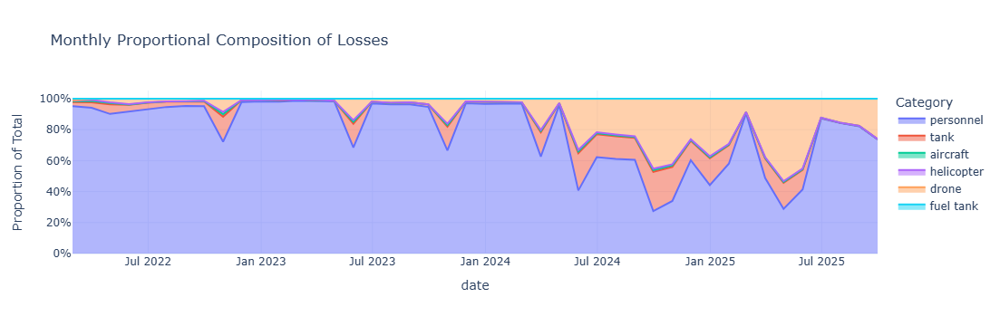

In [34]:
cols = ["personnel", "tank", "aircraft", "helicopter", "drone", "fuel tank"]

# --- Prepare monthly aggregated data ---
monthly_df = (
    df.set_index("date")[cols]
      .resample("ME")
      .sum()
      .reset_index()
)

# --- Compute total and proportions ---
monthly_df["total"] = monthly_df[cols].sum(axis=1)

for c in cols:
    monthly_df[c] = monthly_df[c] / monthly_df["total"]

# --- Plot proportional stacked area chart ---
fig = px.area(
    monthly_df,
    x="date",
    y=cols,
    title="Monthly Proportional Composition of Losses",
    labels={"value": "Proportion of Total", "variable": "Category"},
)
fig.update_layout(
    yaxis=dict(tickformat=".0%"),
    template="plotly_white",
    hovermode="x unified"
)
fig.show()

**Dominacija `personnel` i `drone`**

Grafik jasno pokazuje da dve kategorije konstantno čine **dominantnu većinu** ukupnih mesečnih gubitaka:

* **`personnel`:** Čini **najveći pojedinačni udeo** u ukupnim gubicima u skoro svim mesecima.
* **`drone`:** Predstavljaju **drugi najveći udeo** u većem delu posmatranog perioda.

---
Učešće kategorija se značajno menjalo tokom vremena:

**Period 2022. do Sredine 2023.**

* **Visoka dominacija `personnel`:** U ovom periodu, udeo `personnel` je bio **najstabilniji i najviši**, dostižući blizu **90-95%** ukupnih gubitaka u nekim mesecima (npr. krajem 2022. i početkom 2023.).
* **Minimalno učešće dronova:** Udeo **dronova** je bio **veoma mali** i često neprimetan.

**Period Sredina 2023. do Sredine 2024.**

* **Povećanje učešća dronova:** Udeo **dronova** počinje da **značajno raste** (naročito od kraja 2023. godine), postajući vidljiviji deo kompozicije gubitaka.
* **Pojačana varijabilnost:** Proporcija **osoblja** počinje da **pada** u nekim mesecima (do oko 65-70%) zbog povećanja udela dronova i tenkova.

**Period Sredina 2024. do Sredine 2025.**

* **Najveća disperzija:** Ovo je period **najveće varijabilnosti** i **najnižeg proporcionalnog udela `personnel`**.
    * Udeo `personnel` se spušta do najnižih tačaka, ponekad i **ispod 30%** (npr. leto 2024. i zima 2025.).
    * Udeo **dronova** drastično raste, postajući **dominantna kategorija** u određenim mesecima, popunjavajući veliku površinu (svetlo narandžasta boja). Ovo signalizira da su gubici dronova, u odnosu na ukupan broj gubitaka, postali izuzetno visoki.

---
**Učešće Tenkova i Avijacije**

* **Tenkovi:** Udeo tenkova je relativno mali, ali postaje vidljiv u periodima kada udeo osoblja pada. Učešće tenkova je najviše u drugoj polovini 2024. godine, ali nikada ne dominira.
* **Letelice i Helikopteri (aircraft/helicopter):** Proporcija ovih kategorija je **zanemarljiva** (skoro nevidljiva linija) u ukupnom zbiru gubitaka tokom celog perioda. Ovo je u skladu sa prethodnom analizom, gde smo videli da je ukupan kumulativni broj letelica/helikoptera oko 8.000, dok su ukupni gubici osoblja i dronova u stotinama hiljada.
* **Rezervoari za gorivo (fuel tank - Svetlo plava linija na vrhu):** Proporcija je **minimalna** i uglavnom se jedva primećuje na vrhu grafika.

# 🌐 Veštačke neuronske mreže

In [37]:
# --- Prepare resampling scenarios ---
def resample_scenario(df, freq):
    """
    freq: "D" (daily), "W" (weekly), "ME" (monthly)
    """
    df = df.copy()
    df["date"] = pd.to_datetime(df["date"])
    df_res = df.set_index("date").resample(freq).sum().reset_index()
    df_res["freq"] = freq
    return df_res

def make_sequences(data, lookback=30):
    X, y = [], []
    for i in range(lookback, len(data)):
        X.append(data[i - lookback:i])
        y.append(data[i])
    return np.array(X), np.array(y)

scenarios = {
    "Daily": resample_scenario(df, "D"),
    "Weekly": resample_scenario(df, "W"),
    "Monthly": resample_scenario(df, "ME"),
}

target_col = "personnel"

In [38]:
def smape(y_true, y_pred):
    denom = np.abs(y_true) + np.abs(y_pred)
    return np.mean(2 * np.abs(y_pred - y_true) / np.maximum(denom, 1e-8))

def evaluate_model(model, X_test, y_test, scaler, name):
    pred = model.predict(X_test)
    y_true = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_pred = scaler.inverse_transform(pred.flatten().reshape(-1, 1)).flatten()
    return {
        "Model": name,
        "MAE": mean_absolute_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
        "sMAPE": smape(y_true, y_pred)
    }, y_true, y_pred

In [39]:
def build_lstm(input_shape):
    inputs = keras.Input(shape=input_shape)
    x = keras.layers.LSTM(64, return_sequences=True)(inputs)
    x = keras.layers.LSTM(32)(x)
    x = keras.layers.Dense(16, activation="relu")(x)
    outputs = keras.layers.Dense(1)(x)
    model = keras.Model(inputs, outputs)
    return model

In [40]:
def build_gru(input_shape):
    inputs = keras.Input(shape=input_shape)
    x = keras.layers.GRU(64, return_sequences=True)(inputs)
    x = keras.layers.GRU(32)(x)
    x = keras.layers.Dense(16, activation="relu")(x)
    outputs = keras.layers.Dense(1)(x)
    model = keras.Model(inputs, outputs)
    return model

In [41]:
def build_cnn(input_shape):
    inputs = keras.Input(shape=input_shape)
    x = keras.layers.Conv1D(32, 3, activation="relu")(inputs)
    x = keras.layers.Conv1D(16, 3, activation="relu")(x)
    x = keras.layers.Flatten()(x)
    x = keras.layers.Dense(32, activation="relu")(x)
    outputs = keras.layers.Dense(1)(x)
    model = keras.Model(inputs, outputs)
    return model

In [42]:
def build_bilstm(input_shape):
    inputs = keras.Input(shape=input_shape)
    x = keras.layers.Bidirectional(keras.layers.LSTM(64, return_sequences=True))(inputs)
    x = keras.layers.Bidirectional(keras.layers.LSTM(32))(x)
    x = keras.layers.Dense(16, activation="relu")(x)
    outputs = keras.layers.Dense(1)(x)
    model = keras.Model(inputs, outputs)
    return model

In [43]:
def build_rnn(input_shape):
    inputs = keras.Input(shape=input_shape)
    x = keras.layers.SimpleRNN(64, return_sequences=True)(inputs)
    x = keras.layers.SimpleRNN(32)(x)
    x = keras.layers.Dense(16, activation="relu")(x)
    outputs = keras.layers.Dense(1)(x)
    model = keras.Model(inputs, outputs)
    return model

In [44]:
def build_mlp(input_shape):
    inputs = keras.Input(shape=input_shape)
    x = keras.layers.Flatten()(inputs)
    x = keras.layers.Dense(128, activation="relu")(x)
    x = keras.layers.Dense(64, activation="relu")(x)
    outputs = keras.layers.Dense(1)(x)
    model = keras.Model(inputs, outputs)
    return model

In [45]:
def build_transformer(input_shape, num_heads=2, ff_dim=32):
    inputs = keras.Input(shape=input_shape)
    x = keras.layers.LayerNormalization(epsilon=1e-6)(inputs)
    attn_output = keras.layers.MultiHeadAttention(num_heads=num_heads, key_dim=ff_dim)(x, x)
    x = keras.layers.Add()([x, attn_output])
    ffn = keras.Sequential([
        keras.layers.Dense(ff_dim, activation="relu"),
        keras.layers.Dense(input_shape[-1])
    ])
    x = keras.layers.Add()([x, ffn(x)])
    x = keras.layers.GlobalAveragePooling1D()(x)
    outputs = keras.layers.Dense(1)(x)
    model = keras.Model(inputs, outputs)
    return model


=== Training on Daily data ===

Training Daily - LSTM (MSE, Adam)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step


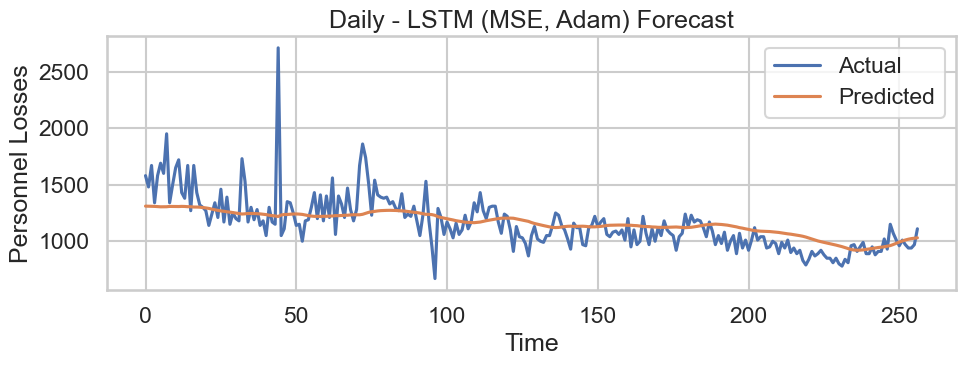


Training Daily - LSTM (MSE, RMSprop)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 189ms/step


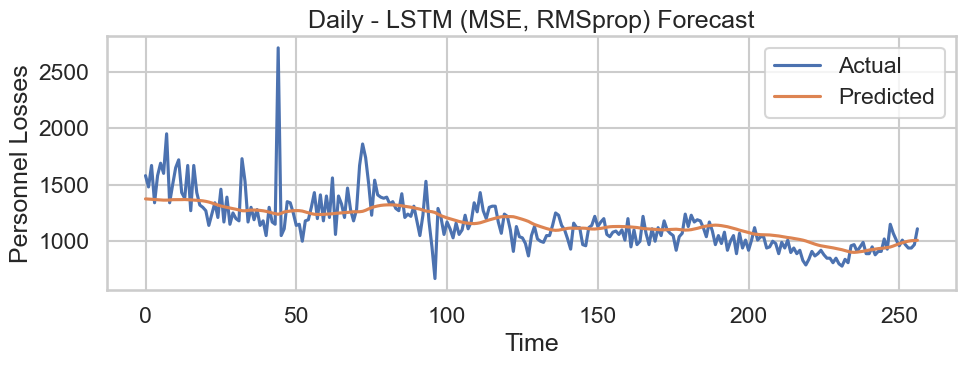


Training Daily - LSTM (MAE, Adam)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 192ms/step


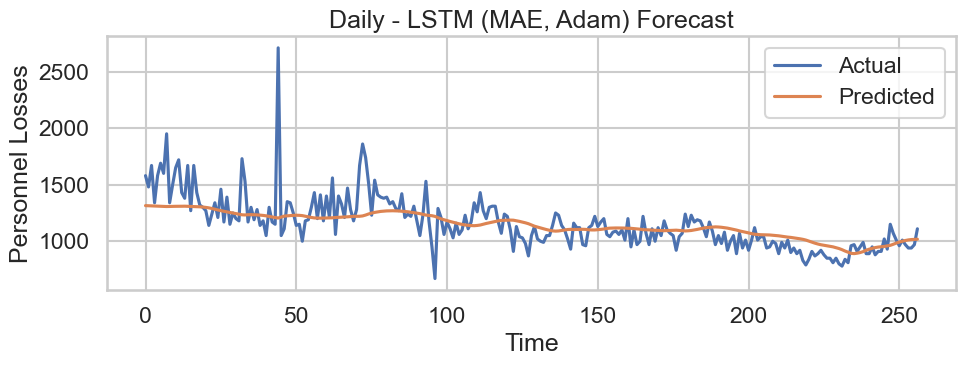


Training Daily - LSTM (MAE, RMSprop)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 199ms/step


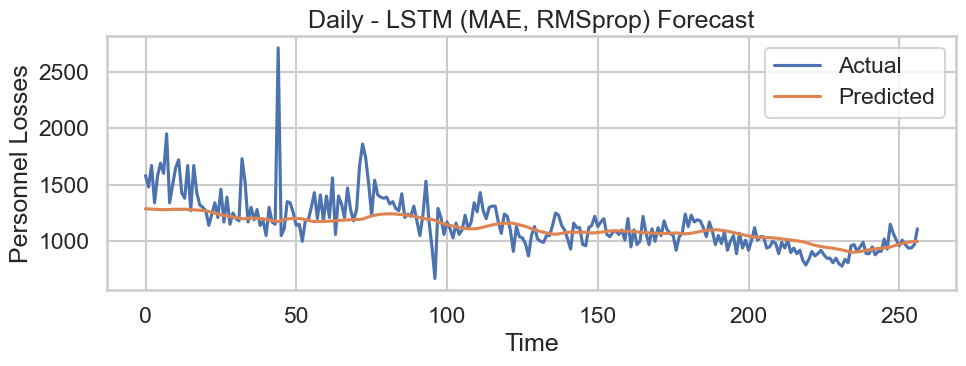


Training Daily - LSTM (Huber, Adam)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 213ms/step


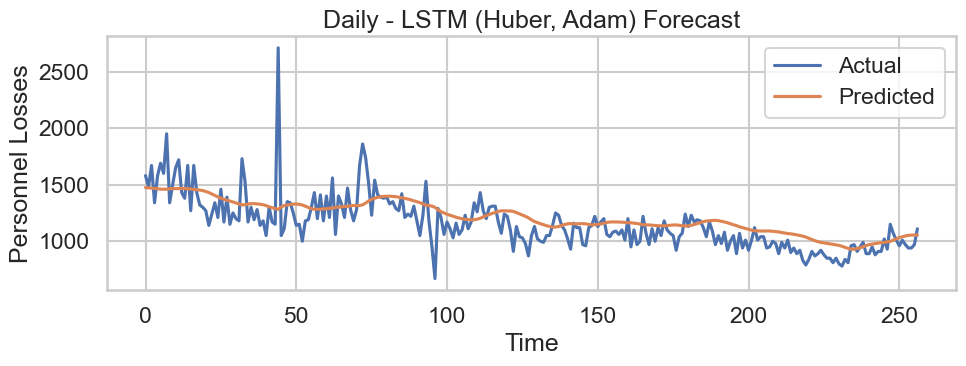


Training Daily - LSTM (Huber, RMSprop)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 206ms/step


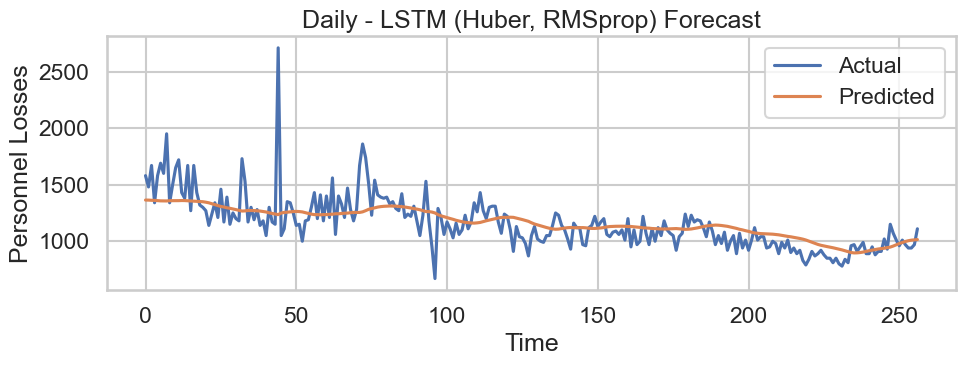


Training Daily - GRU (MSE, Adam)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 292ms/step


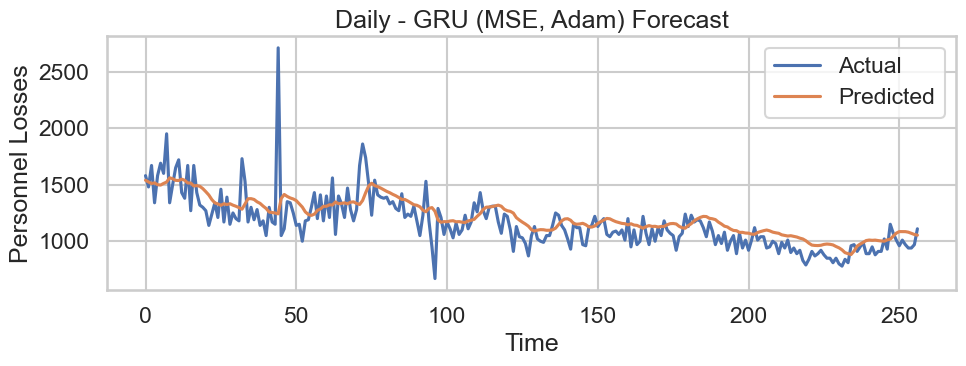


Training Daily - GRU (MSE, RMSprop)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 325ms/step


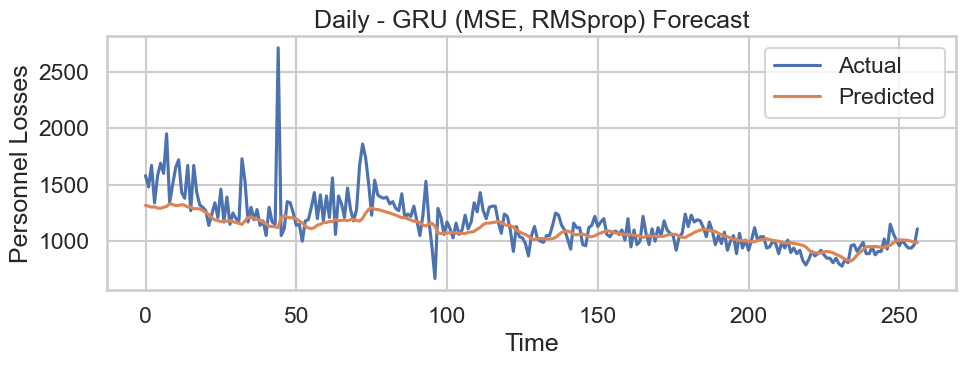


Training Daily - GRU (MAE, Adam)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 305ms/step


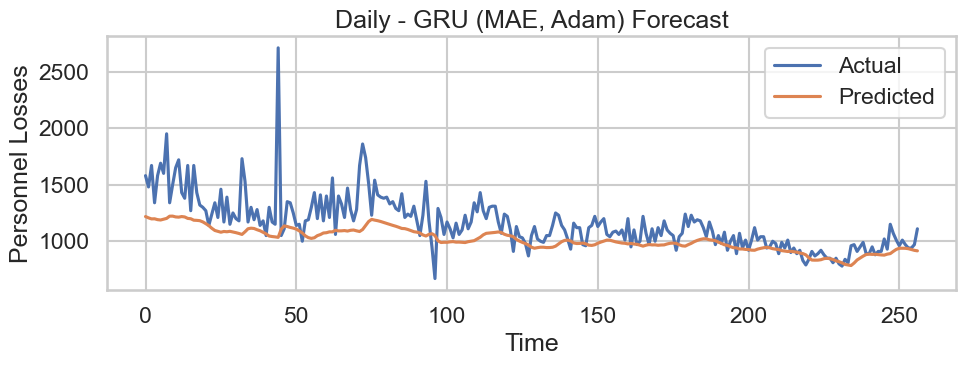


Training Daily - GRU (MAE, RMSprop)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 292ms/step


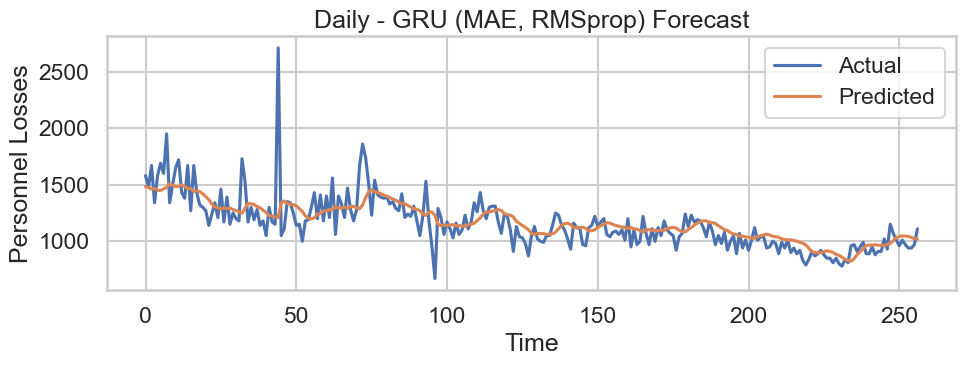


Training Daily - GRU (Huber, Adam)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 284ms/step


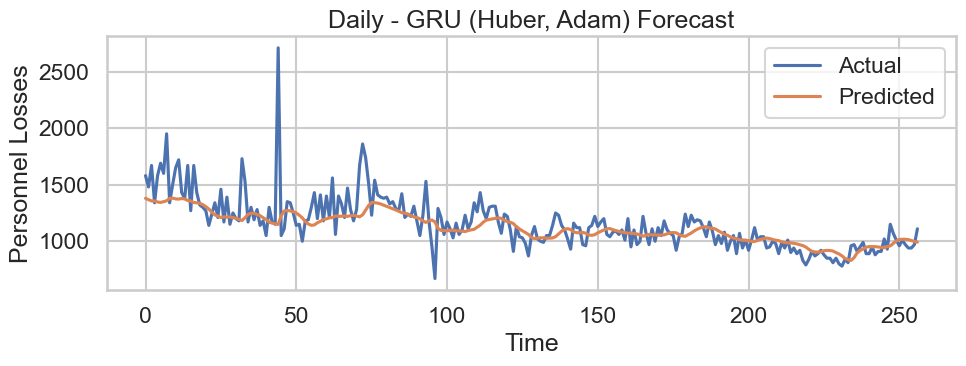


Training Daily - GRU (Huber, RMSprop)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 338ms/step


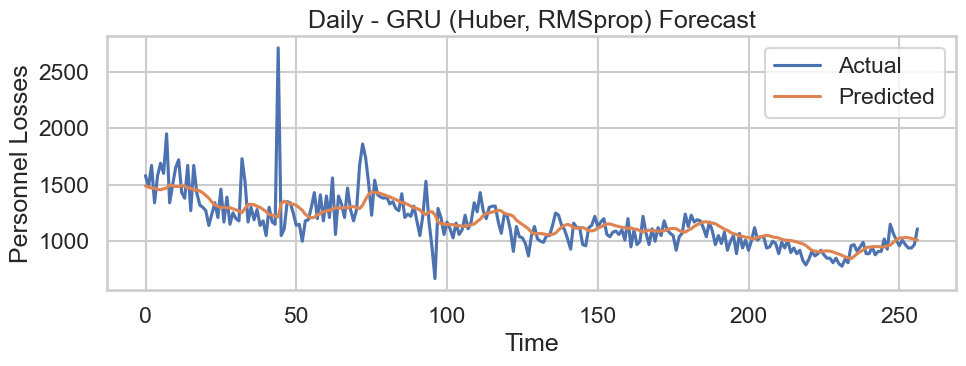


Training Daily - CNN (MSE, Adam)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


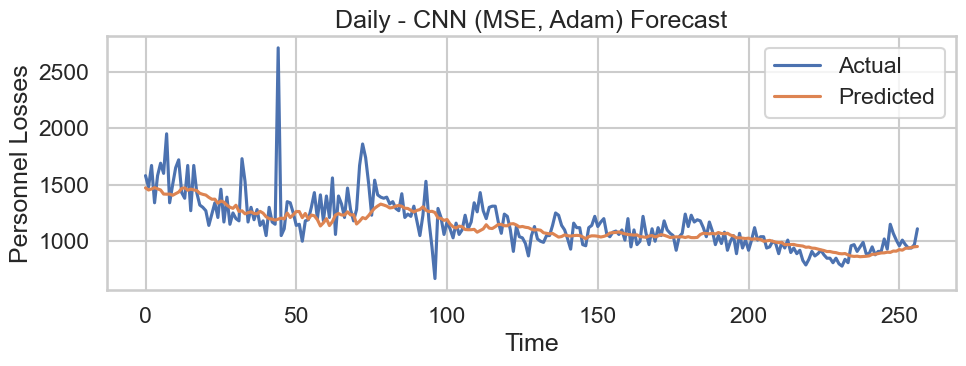


Training Daily - CNN (MSE, RMSprop)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


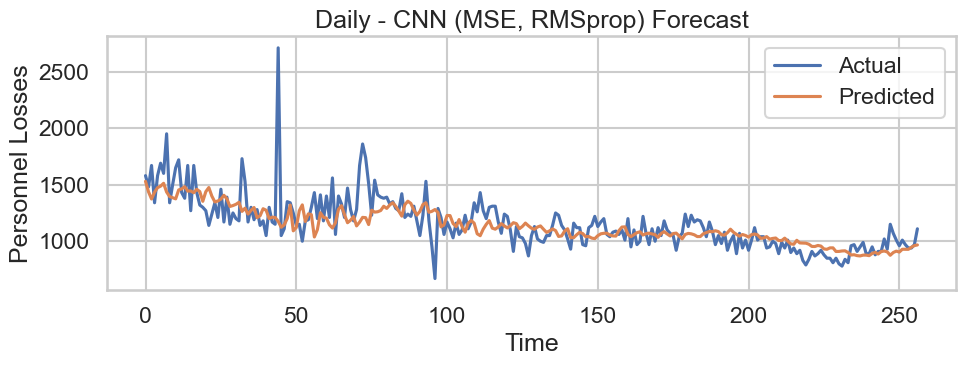


Training Daily - CNN (MAE, Adam)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


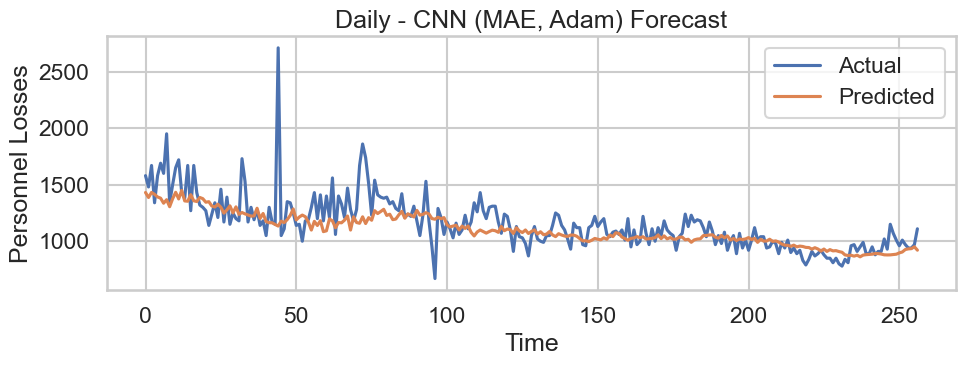


Training Daily - CNN (MAE, RMSprop)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


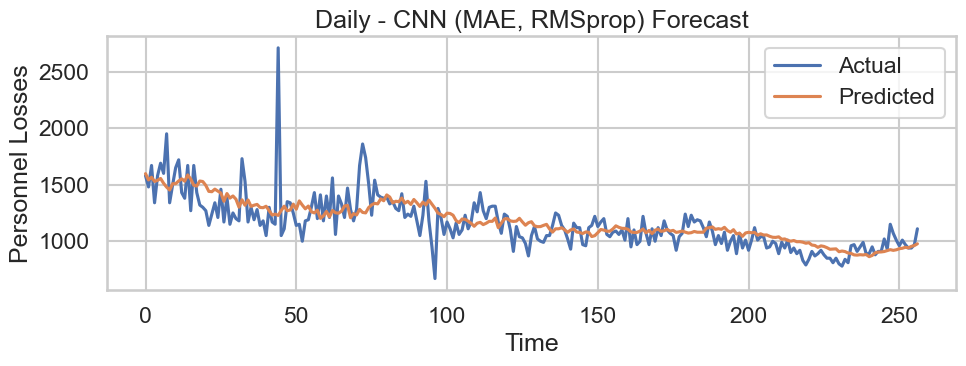


Training Daily - CNN (Huber, Adam)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


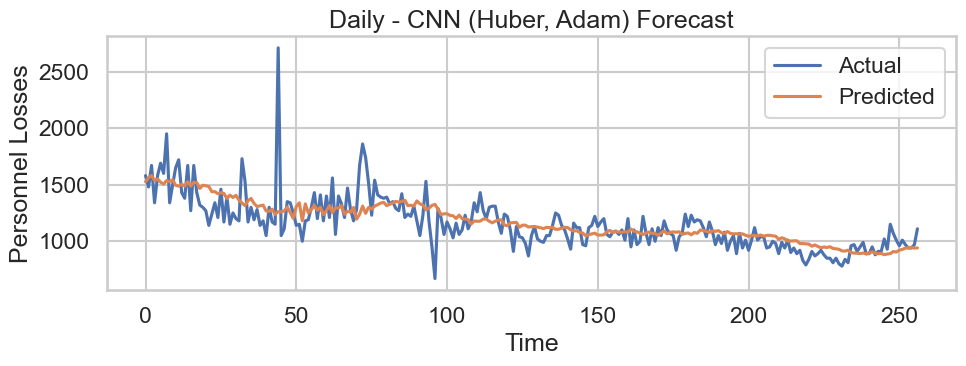


Training Daily - CNN (Huber, RMSprop)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


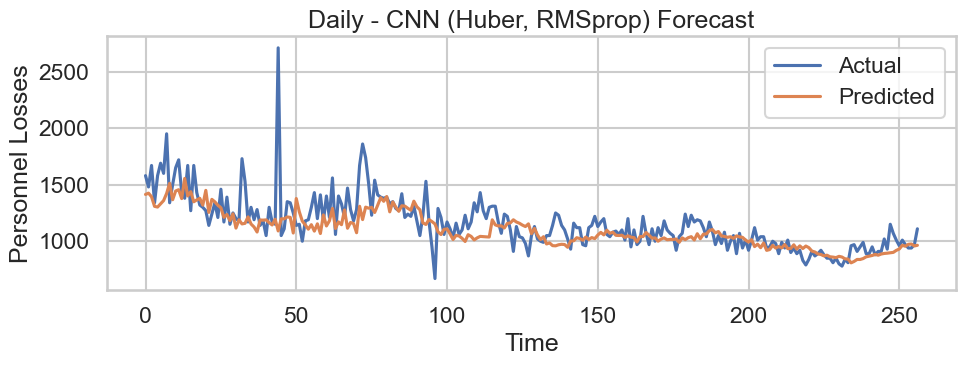


Training Daily - RNN (MSE, Adam)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step


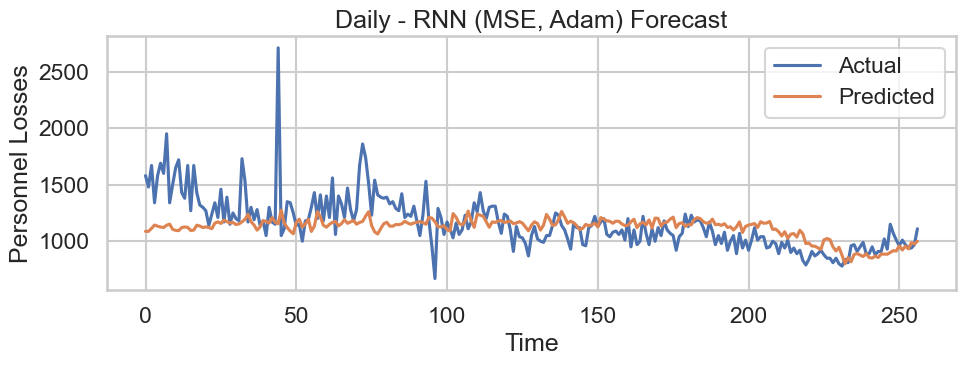


Training Daily - RNN (MSE, RMSprop)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step


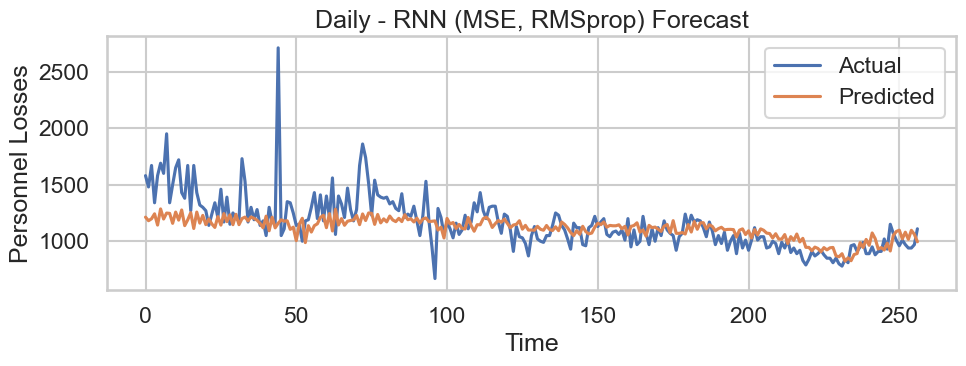


Training Daily - RNN (MAE, Adam)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 116ms/step


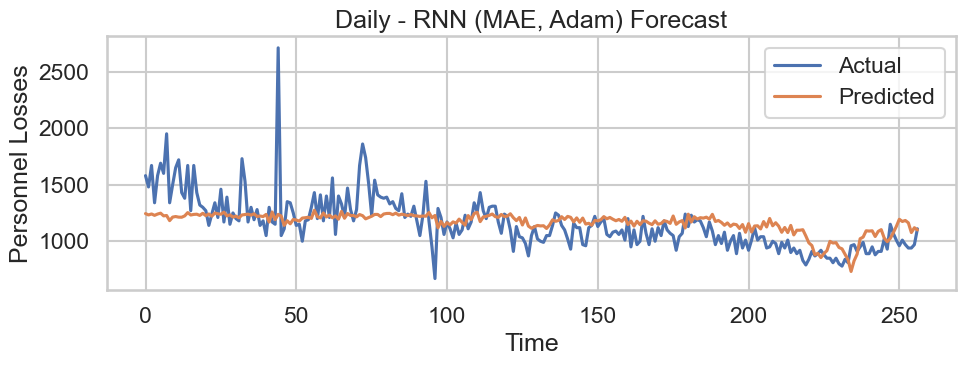


Training Daily - RNN (MAE, RMSprop)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step


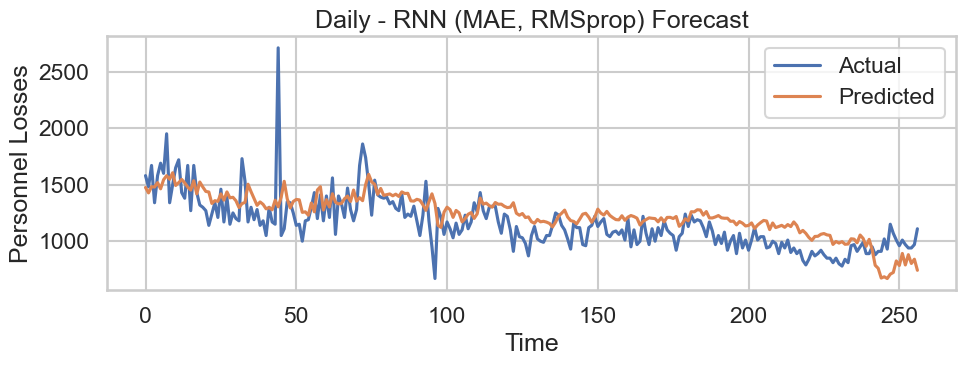


Training Daily - RNN (Huber, Adam)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step


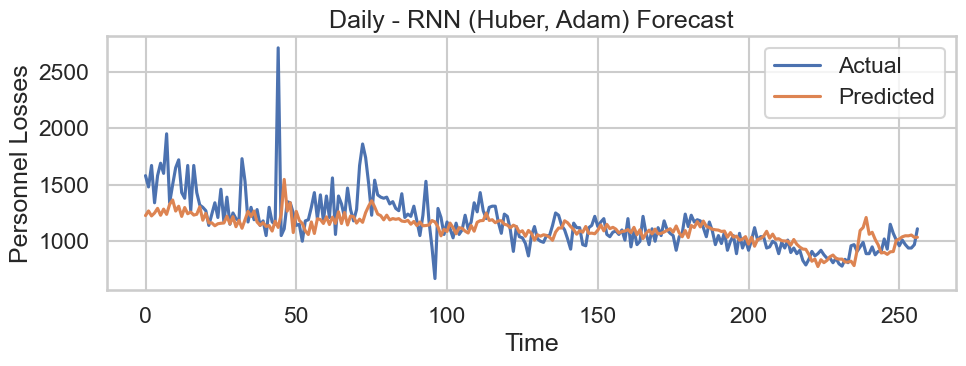


Training Daily - RNN (Huber, RMSprop)...
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step


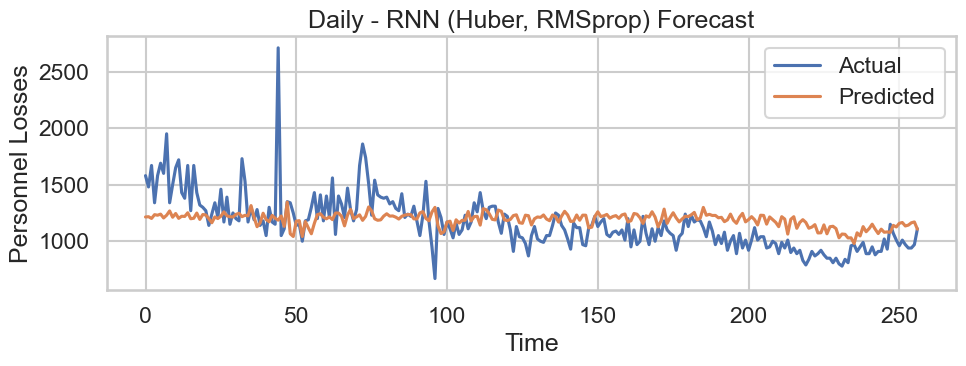


=== Training on Weekly data ===

Training Weekly - LSTM (MSE, Adam)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step


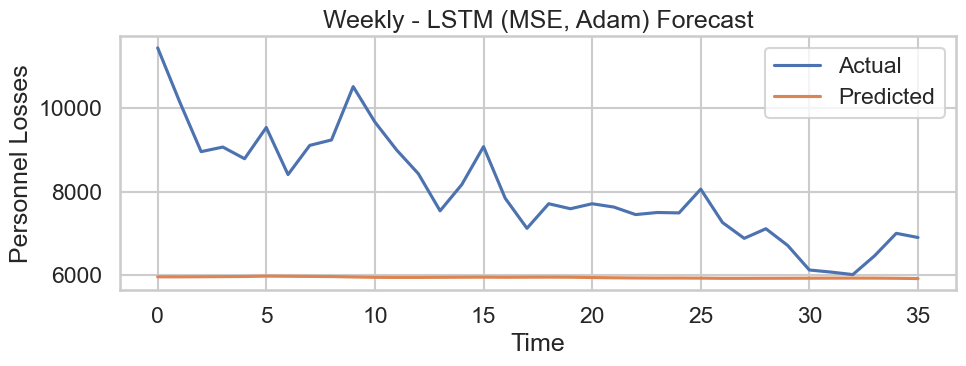


Training Weekly - LSTM (MSE, RMSprop)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step


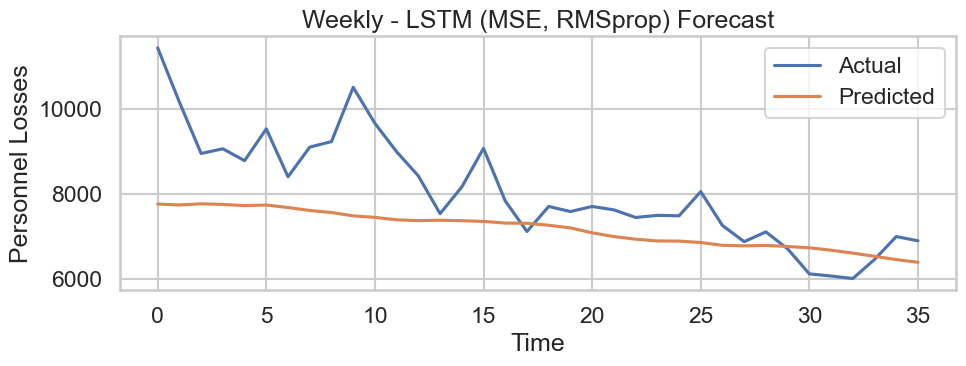


Training Weekly - LSTM (MAE, Adam)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


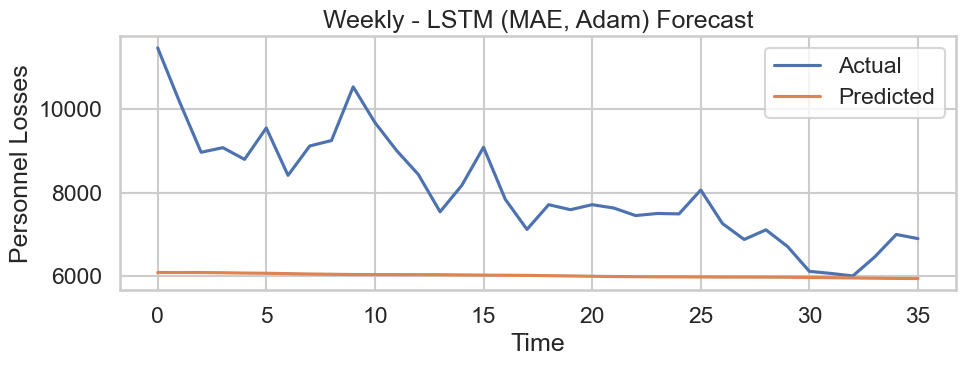


Training Weekly - LSTM (MAE, RMSprop)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


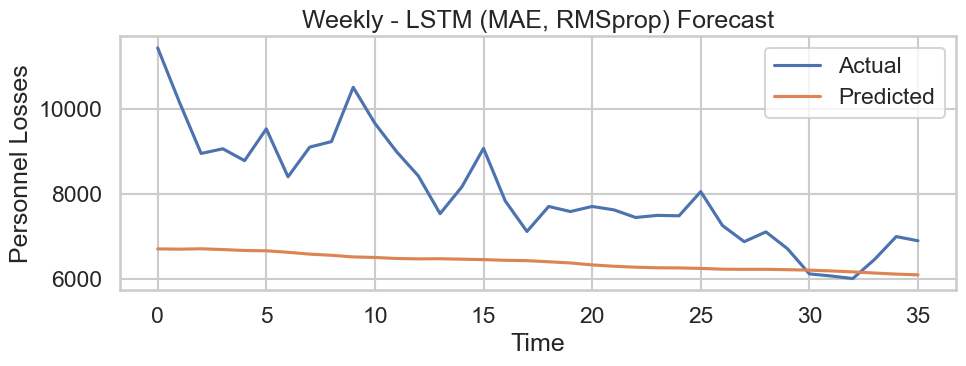


Training Weekly - LSTM (Huber, Adam)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


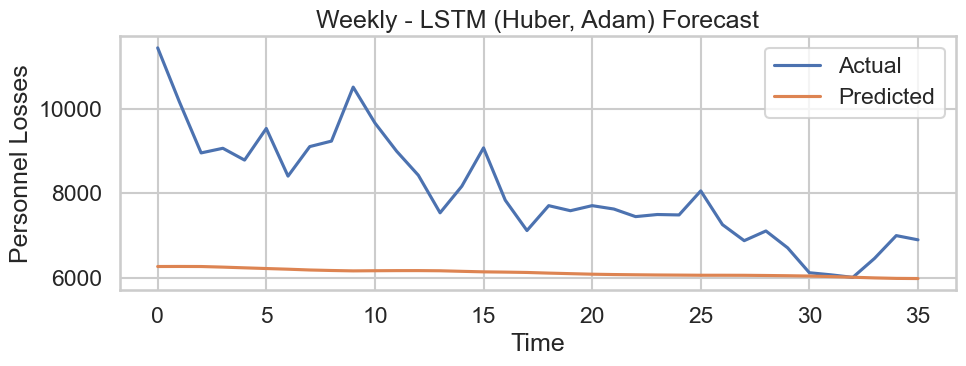


Training Weekly - LSTM (Huber, RMSprop)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


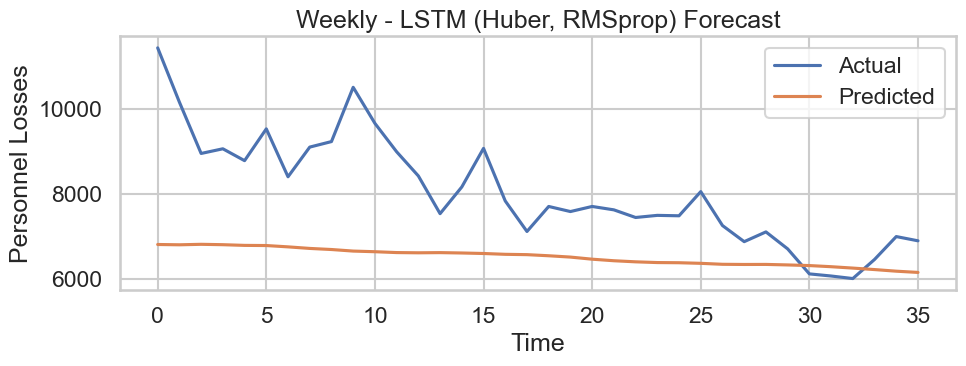


Training Weekly - GRU (MSE, Adam)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step


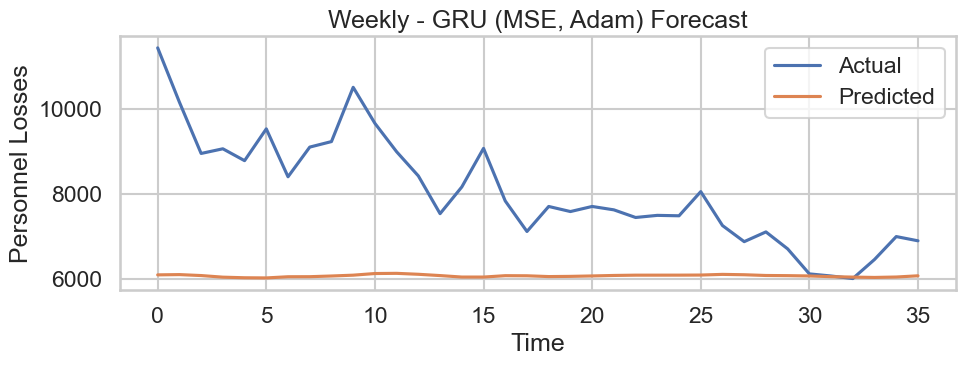


Training Weekly - GRU (MSE, RMSprop)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


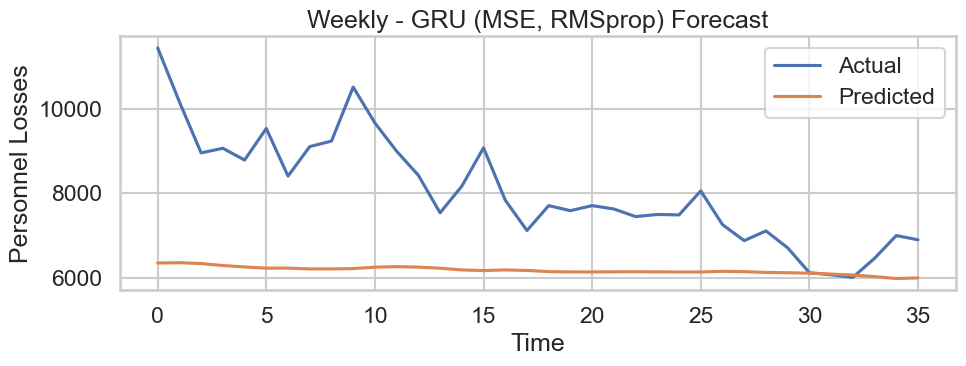


Training Weekly - GRU (MAE, Adam)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


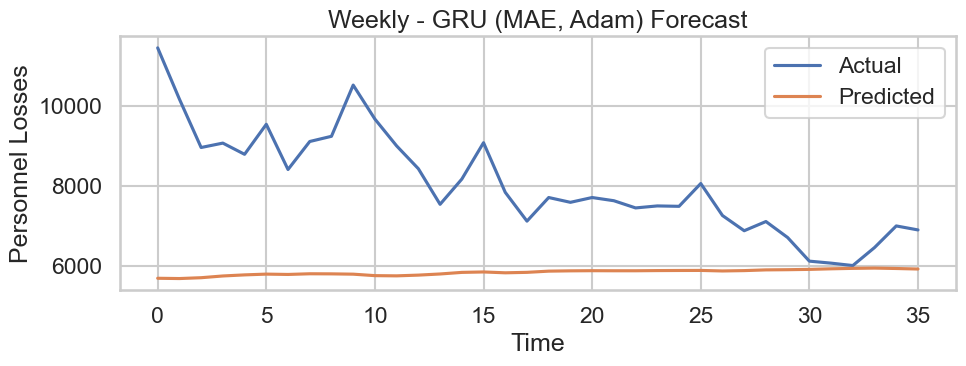


Training Weekly - GRU (MAE, RMSprop)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step


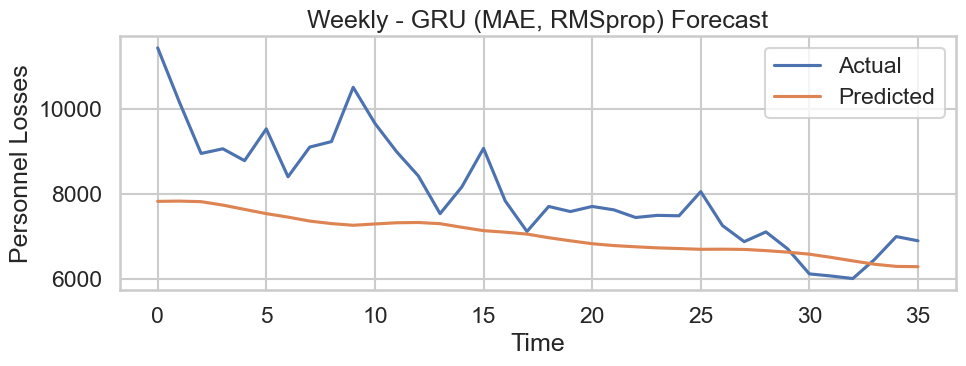


Training Weekly - GRU (Huber, Adam)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


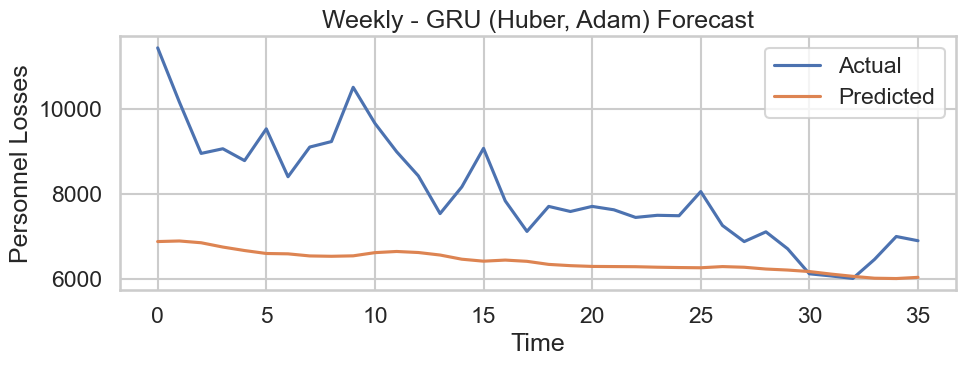


Training Weekly - GRU (Huber, RMSprop)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step


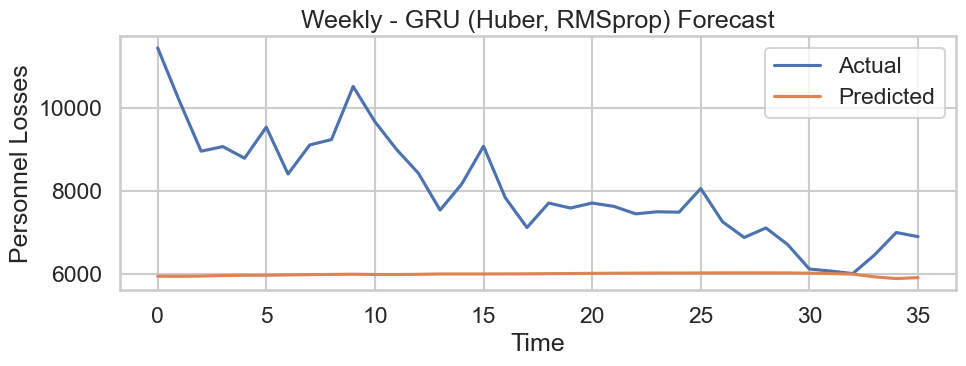


Training Weekly - CNN (MSE, Adam)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


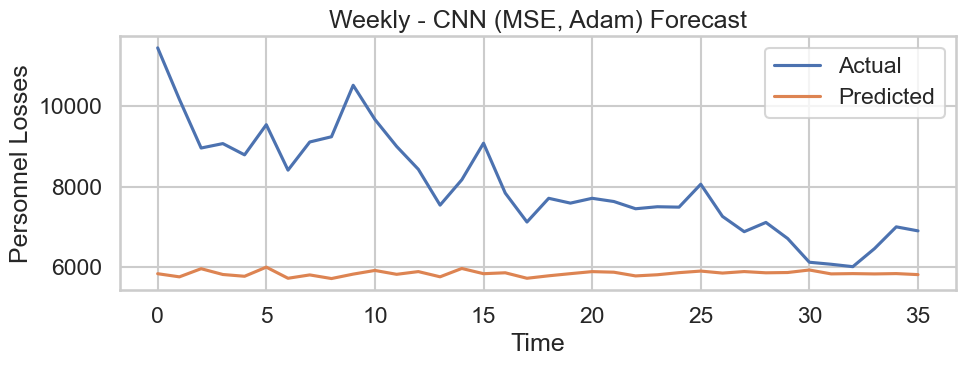


Training Weekly - CNN (MSE, RMSprop)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


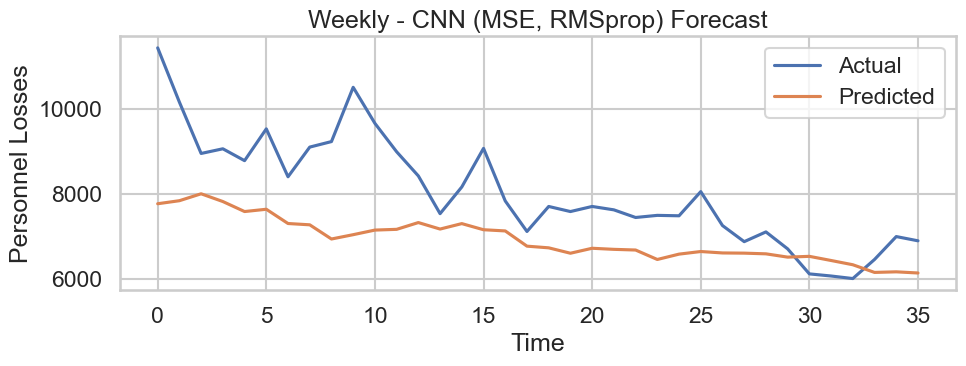


Training Weekly - CNN (MAE, Adam)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


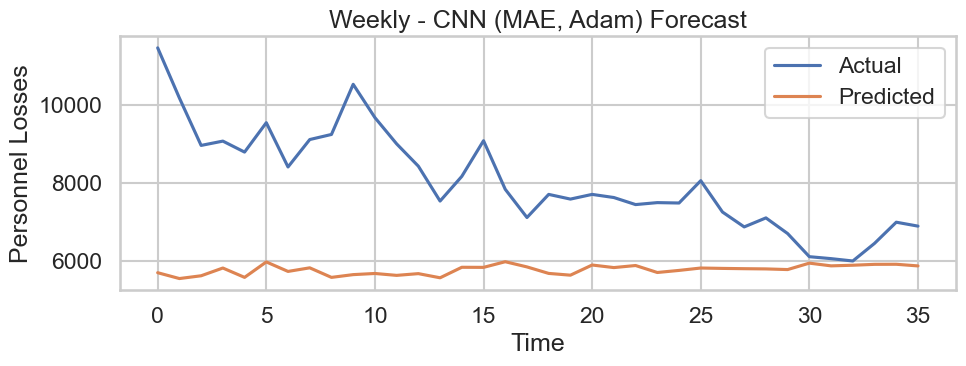


Training Weekly - CNN (MAE, RMSprop)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


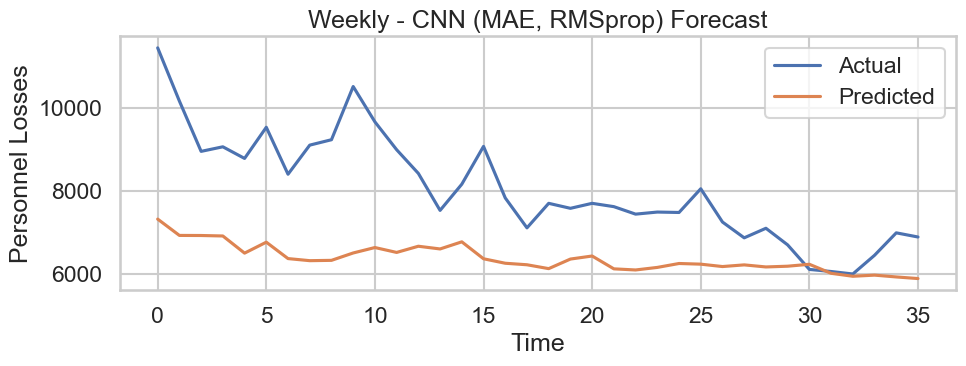


Training Weekly - CNN (Huber, Adam)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


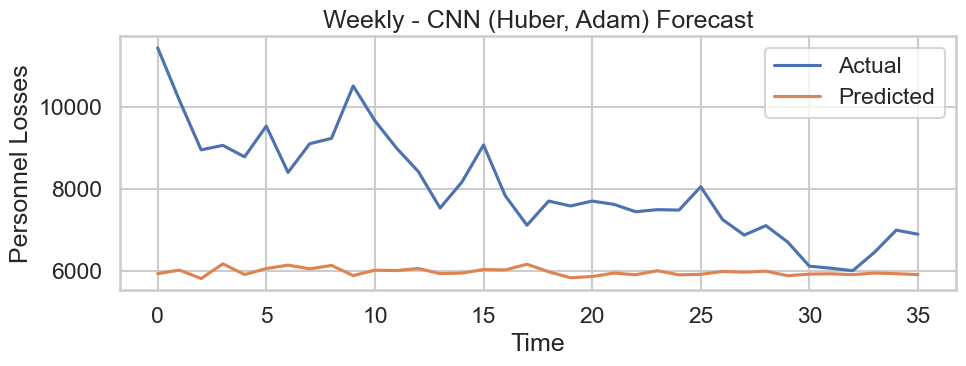


Training Weekly - CNN (Huber, RMSprop)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


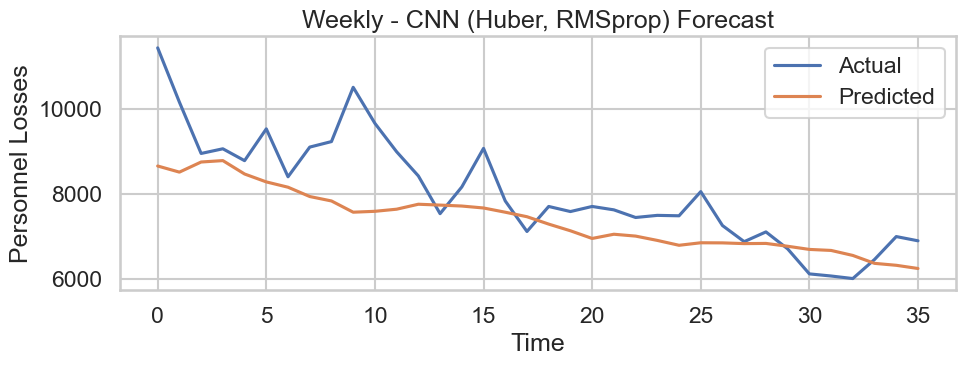


Training Weekly - RNN (MSE, Adam)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


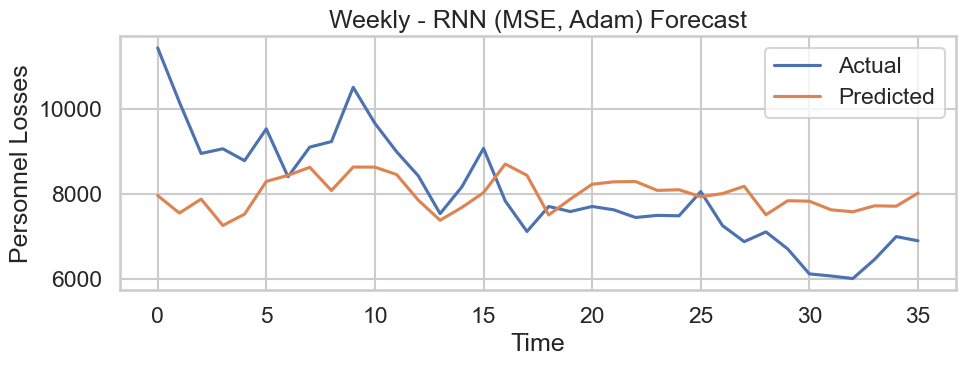


Training Weekly - RNN (MSE, RMSprop)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


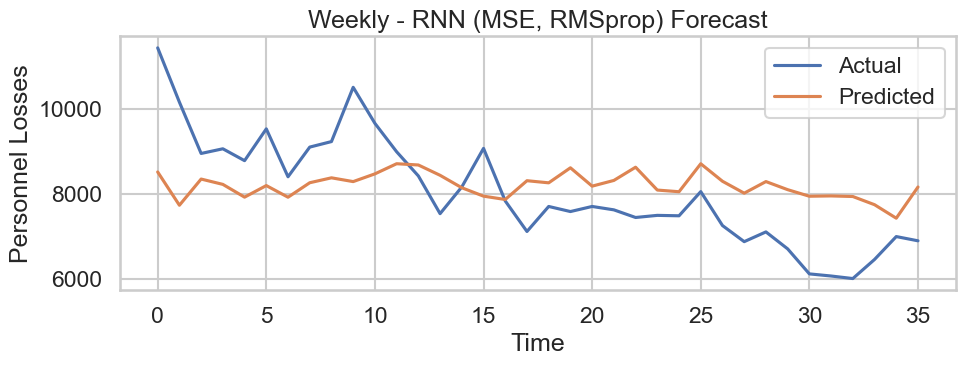


Training Weekly - RNN (MAE, Adam)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


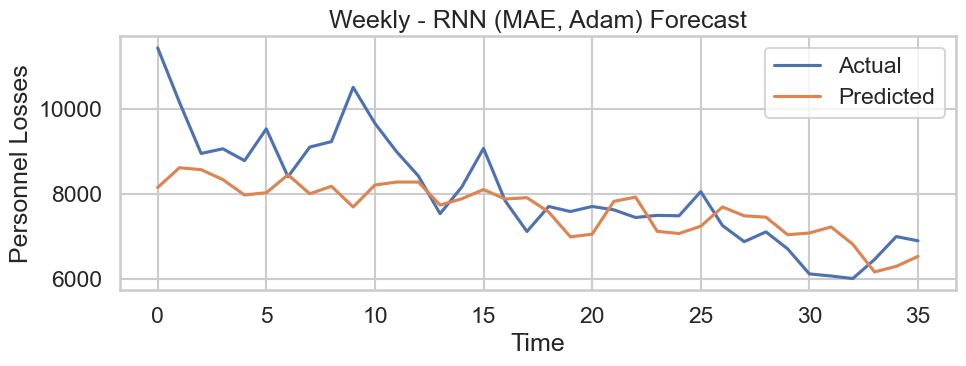


Training Weekly - RNN (MAE, RMSprop)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


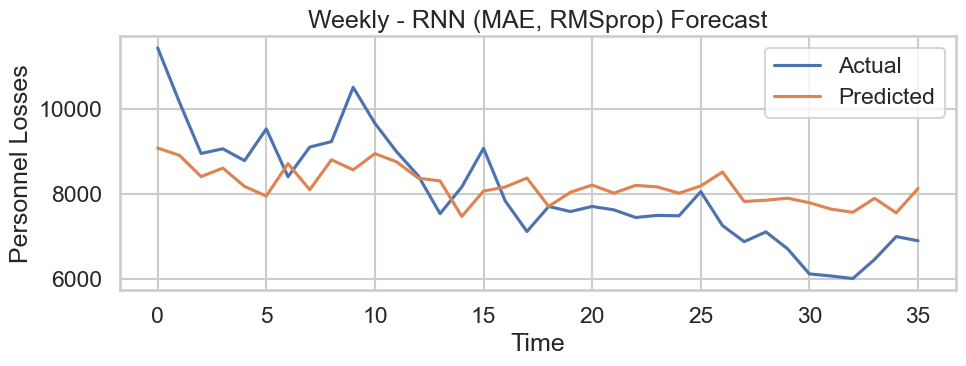


Training Weekly - RNN (Huber, Adam)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


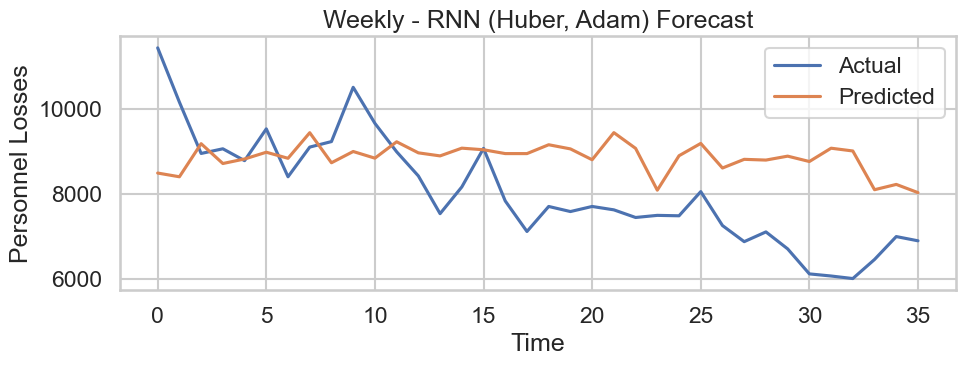


Training Weekly - RNN (Huber, RMSprop)...
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


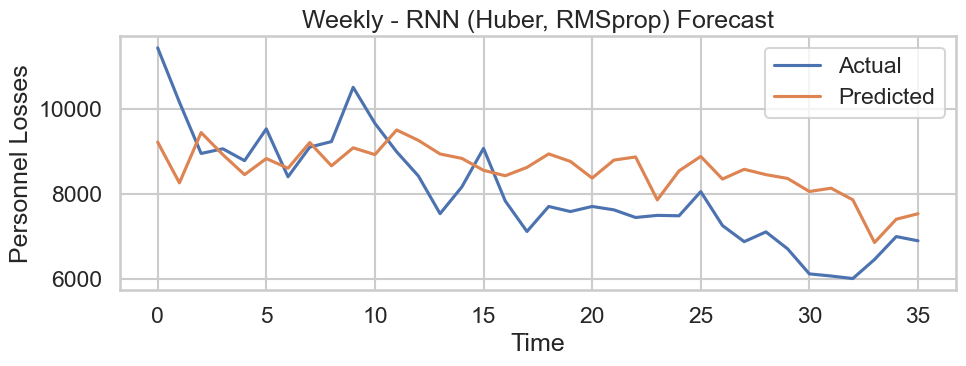


=== Training on Monthly data ===
Not enough samples for Monthly. Skipping.


In [46]:
loss_functions = {
    "MSE": keras.losses.MeanSquaredError(),
    "MAE": keras.losses.MeanAbsoluteError(),
    "Huber": keras.losses.Huber(),
    # "LogCosh": keras.losses.LogCosh(),
    # "MSLE": keras.losses.MeanSquaredLogarithmicError(),
}

model_builders = {
    "LSTM": lambda input_shape: build_lstm(input_shape),
    "GRU": lambda input_shape: build_gru(input_shape),
    "CNN": lambda input_shape: build_cnn(input_shape),
    "RNN": lambda input_shape: build_rnn(input_shape),
    # "BiLSTM": lambda input_shape: build_bilstm(input_shape),
    # "MLP": lambda input_shape: build_mlp(input_shape)
}

optimizer_builders = {
    "Adam": lambda: keras.optimizers.Adam(learning_rate=0.001),
    "RMSprop": lambda: keras.optimizers.RMSprop(learning_rate=0.001),
    # "Nadam": lambda: keras.optimizers.Nadam(learning_rate=0.001),
}


# --- Train loop ---
all_results = []

for scenario_name, df_scenario in scenarios.items():
    print(f"\n=== Training on {scenario_name} data ===")

    # Prepare target
    y = df_scenario[target_col].astype(float).values
    scaler = StandardScaler()
    y_scaled = scaler.fit_transform(y.reshape(-1, 1)).flatten()

    # Build sequences (reduce lookback for longer intervals)
    lookback = 30 if scenario_name == "Daily" else 10 if scenario_name == "Weekly" else 5
    X, y_seq = make_sequences(y_scaled, lookback)

    # Skip if not enough data
    if len(X) < 100:
        print(f"Not enough samples for {scenario_name}. Skipping.")
        continue

    # Split
    split = int(len(X) * 0.8)
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y_seq[:split], y_seq[split:]
    X_train = np.expand_dims(X_train, -1)
    X_test = np.expand_dims(X_test, -1)

    # Train each model/loss/optimizer combination
    for model_name, model_fn in model_builders.items():
        for loss_name, loss_fn in loss_functions.items():
            for opt_name, opt_fn in optimizer_builders.items():
                model = model_fn(X_train.shape[1:])
                optimizer = opt_fn()
                model.compile(optimizer=optimizer, loss=loss_fn)
                model.run_eagerly = True

                name = f"{scenario_name} - {model_name} ({loss_name}, {opt_name})"
                print(f"\nTraining {name}...")

                callbacks = [
                    keras.callbacks.EarlyStopping(monitor="val_loss", patience=8, restore_best_weights=True)
                ]

                history = model.fit(
                    X_train, y_train,
                    epochs=1,
                    batch_size=32,
                    validation_split=0.1,
                    callbacks=callbacks,
                    verbose=0
                )

                res, y_true, y_pred = evaluate_model(model, X_test, y_test, scaler, name)
                res["Scenario"] = scenario_name
                all_results.append(res)

                # Plot
                plt.figure(figsize=(10, 4))
                plt.plot(y_true, label="Actual")
                plt.plot(y_pred, label="Predicted")
                plt.title(f"{name} Forecast")
                plt.xlabel("Time")
                plt.ylabel("Personnel Losses")
                plt.legend()
                plt.tight_layout()
                plt.show()

**Daily Forecasting**

Dnevni grafici (Daily - LSTM, GRU, CNN, RNN) pokazuju predviđanje za oko 250 vremenskih koraka.

* **Izglađivanje (Smoothing):** Svi modeli, bez obzira na arhitekturu i hiperparametre, pokazuju tendenciju **izglađivanja (smoothing)** stvarne serije. Predviđene linije (narandžaste) prate opšti trend, ali su **mnogo manje volatilne** od stvarnih podataka (plave linije).
* **Loše hvatanje vrhunaca:** Modeli **ne uspevaju** da precizno predvide **oštre i visoke vrhunce** (šiljke), koji su karakteristični za dnevne gubitke. Ovi vrhunci su ključni izvori greške.
* **Trend praćenja:** Predviđene linije efikasno prate **dugoročni opadajući trend** koji je prisutan u testnom setu (od oko 1500 do oko 1000).

**Poređenje modela (Daily)**

* **LSTM, GRU, RNN:** Sva tri modela (Long Short-Term Memory, Gated Recurrent Unit, Recurrent Neural Network) pokazuju **vrlo slične performanse**. Oni su dizajnirani za vremenske serije i prilično dobro prate bazni nivo.
* **CNN (Convolutional Neural Network):** Modeli CNN-a takođe pokazuju iznenađujuće dobre performanse u praćenju trenda, što ukazuje da CNN uspeva da uhvati relevantne lokalne obrasce u sekvencama.

**Uticaj funkcija gubitka i optimizatora (Daily)**

* **Huber Loss (u poređenju sa MSE/MAE):** Modeli trenirani sa **Huber** funkcijom gubitka (koja je robusnija na ekstremne tačke, tj. šiljke) ne pokazuju očigledno bolje vizuelno uklapanje na vrhuncima od modela treniranih sa MSE ili MAE. To potvrđuje da je predviđanje oštrih odstupanja inherentno teško u ovom setu podataka.
* **Adam vs. RMSprop:** Vizuelno, **nema značajne razlike** u kvalitetu predviđanja između modela treniranih sa Adam i RMSprop optimizatorima.

---
**Weekly Forecasting**

Nedeljni grafici (Weekly - RNN, CNN, GRU, LSTM) pokazuju predviđanje za oko 35 vremenskih koraka.

* **Veća varijabilnost greške:** Modeli imaju **veće poteškoće** u tačnom praćenju nedeljnih oscilacija nego dnevnih, s obzirom na to da nedeljni podaci imaju **manje tačaka** za obuku.
* **Precenjivanje/Potcenjivanje:** Predviđene linije često **drastično potcenjuju** stvarne gubitke, naročito u modelima **CNN** i **GRU** kada se koristi **MAE** ili **Huber** (npr. Weekly - GRU (Huber, Adam) gde predviđena linija (narandžasta) konstantno leži daleko ispod stvarne).
* **Potpuni neuspeh u praćenju:** U mnogim nedeljnim slučajevima (posebno GRU i CNN sa određenim postavkama), predviđena linija izgleda skoro **horizontalno** ili prati **blagi, ali preterano izglađen pad**, dok stvarni podaci osciliraju između 6000 i 10000.

**Poređenje modela (Weekly)**

* **RNN (Recurrent Neural Network):** Vizuelno, RNN modeli (npr., RNN (MAE, Adam) ili RNN (Huber, Adam)) izgledaju kao da **najbolje prate opšte oscilacije** i nivo stvarne serije, iako i dalje potcenjuju ili precenjuju vrhunce.
* **GRU/LSTM/CNN:** Ovi modeli se bore da uhvate značajnu nedeljnu varijabilnost i često daju predviđanja koja su **previše konzervativna** (previše izglađena ili previše niska), što rezultira velikom greškom.

---
> Na dnevnom nivou, sve arhitekture (LSTM, GRU, CNN, RNN) i funkcije gubitka/optimizatora su **prilično robusne** u hvatanju dugoročnog trenda. Nijedna kombinacija se vizuelno ne izdvaja kao apsolutni pobednik, ali generalno, **GRU i LSTM** su prikladni za ovu vrstu podataka.

> Za nedeljni set, **RNN** modeli pokazuju relativno bolje rezultate u praćenju oscilacija u poređenju sa izrazito podcenjivačkim GRU i CNN modelima.

                             Model          MAE         RMSE     sMAPE  \
10       Daily - GRU (Huber, Adam)   102.201090   171.195378  0.084137   
11    Daily - GRU (Huber, RMSprop)   104.428441   162.601007  0.086499   
9       Daily - GRU (MAE, RMSprop)   104.433933   162.747193  0.086596   
12         Daily - CNN (MSE, Adam)   108.645682   171.236704  0.090133   
7       Daily - GRU (MSE, RMSprop)   110.515609   181.991291  0.090729   
16       Daily - CNN (Huber, Adam)   112.852615   168.090377  0.093834   
1      Daily - LSTM (MSE, RMSprop)   113.701447   171.969180  0.094717   
14         Daily - CNN (MAE, Adam)   113.736123   179.825823  0.094649   
15      Daily - CNN (MAE, RMSprop)   114.182227   169.844174  0.094918   
3      Daily - LSTM (MAE, RMSprop)   114.394989   183.561651  0.094501   
5    Daily - LSTM (Huber, RMSprop)   115.252659   173.483076  0.096112   
2         Daily - LSTM (MAE, Adam)   115.319887   178.834633  0.095914   
13      Daily - CNN (MSE, RMSprop)   1

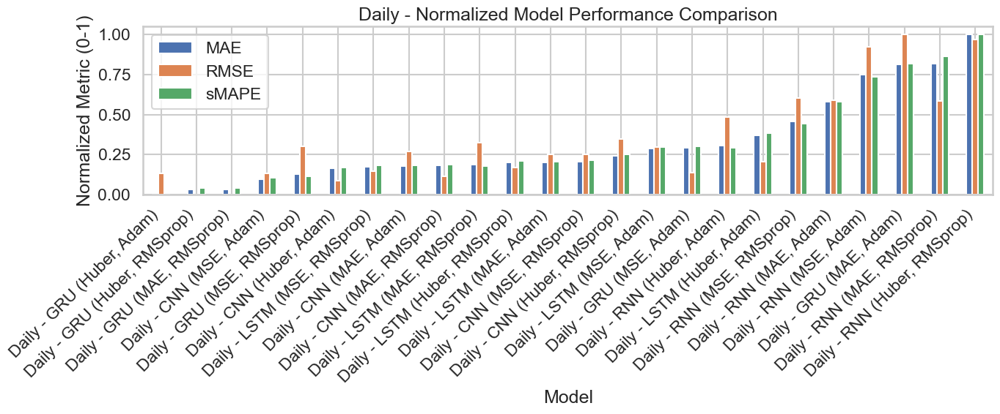

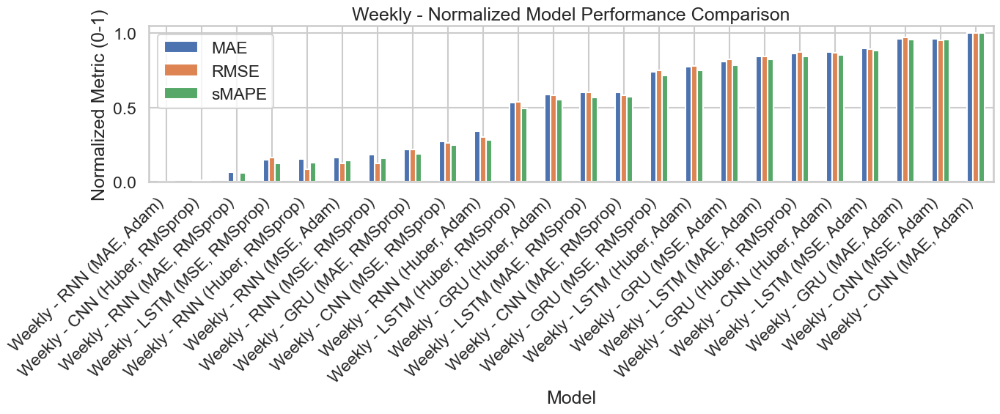

In [48]:
# Assume `all_results` or `results` contains a "Scenario" column
results_df = pd.DataFrame(all_results).sort_values(["Scenario", "MAE"])
print(results_df)

metrics = ["MAE", "RMSE", "sMAPE"]

# --- Normalize metrics within each scenario ---
norm_df = results_df.copy()
for scen in norm_df["Scenario"].unique():
    scen_mask = norm_df["Scenario"] == scen
    for m in metrics:
        vals = norm_df.loc[scen_mask, m]
        norm_df.loc[scen_mask, m] = (vals - vals.min()) / (vals.max() - vals.min())

# --- Plot per scenario ---
for scen in norm_df["Scenario"].unique():
    scen_df = norm_df[norm_df["Scenario"] == scen]
    scen_df.plot(
        x="Model",
        y=metrics,
        kind="bar",
        figsize=(14, 6),
        title=f"{scen} - Normalized Model Performance Comparison",
    )
    plt.ylabel("Normalized Metric (0-1)")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

#### Daily scenario

Konfiguracije su poređane od najbolje (najniža vrednost) ka najgoroj (najviša vrednost) na osnovu performansi.

Na y-osi je **normalizovana vrednost metrike**, što znači da su sve metrike skalirane tako da se kreću od 0 do 1. *Manja vrednost ukazuje na **bolju** performansu.*

---
**Najbolje Performanse (Najbliže Nuli)**

Konfiguracije s **najboljom performansom** (najniže trake) su:
1.  **Daily - GRU (Huber, Adam)**
2.  **Daily - GRU (Huber, RMSprop)**
3.  **Daily - GRU (MAE, RMSprop)**
4.  **Daily - CNN (MSE, RMSprop)**

> Generalno, **GRU modeli** dominiraju u levom delu grafikona (bolje performanse), posebno u kombinaciji sa Huber funkcijom gubitka.

---
**Najlošije Performanse (Najbliže Jedinici)**

Konfiguracije s **najlošijom performansom** (najviše trake) su:
1.  **Daily - RNN (Huber, RMSprop)**
2.  **Daily - GRU (MAE, Adam)**
3.  **Daily - RNN (MSE, RMSprop)**

> **RNN modeli** (jednostavni rekurentni) se nalaze na desnom kraju, što sugeriše da su u ovom zadatku dali najlošije rezultate u poređenju sa GRU, LSTM i CNN modelima.

---
* **RMSE** (Narandžasta) je u većini slučajeva **najviša** metrika za datu konfiguraciju. To je očekivano, jer RMSE daje veću težinu većim greškama u poređenju sa MAE.
* **sMAPE** (Zelena) je često najniža ili blizu MAE, posebno za modele sa boljim performansama.

---
#### Weekly scenario

Iako je struktura grafikona slična prethodnom (metrike, normalizovana skala), rezultati i najbolji modeli su se značajno promenili u odnosu na dnevne podatke.

---
**Najbolje Performanse (Najbliže Nuli)**

Za nedeljne podatke, modeli sa **najboljim performansama** (najniže trake) dominiraju na levoj strani. Karakteristike najboljih modela su:

1.  **Weekly - RNN (MAE, Adam)**: Iako je to RNN, koji je bio najgori za dnevne podatke, ovde ima nizak **sMAPE** (zelena traka), vrednost blizu 0.1.
2.  **Weekly - CNN (Huber, RMSprop)**
3.  **Weekly - RNN (MAE, RMSprop)**
4.  **Weekly - LSTM (MSE, RMSprop)**: Takođe ima veoma niske vrednosti.

> Za nedeljno predviđanje, **RNN** i **CNN** modeli daju bolje rezultate od **GRU** i **LSTM** modela. **MAE** funkcija gubitka i **RMSprop** optimizator se često pojavljuju u najboljim konfiguracijama.

---
**Najlošije Performanse (Najbliže Jedinici)**

Modeli sa **najlošijom performansom** (najviše trake) su na desnoj strani:

1.  **Weekly - GRU (MAE, Adam)**
2.  **Weekly - CNN (MAE, Adam)**
3.  **Weekly - CNN (MAE, RMSprop)**

> **CNN** i **GRU** modeli, posebno u kombinaciji sa **MAE** funkcijom gubitka, lošije se snalaze u ovom opsegu performansi, dostižući vrednosti blizu **0.9** za sve tri metrike.

---
**Ne postoji univerzalno najbolji model**:

* **Dnevno (Daily):** Najbolji model je bio **GRU (Huber, Adam)**.
* **Nedeljno (Weekly):** Najbolji model je **RNN (MAE, Adam)**.

> Ovo sugeriše da **frekvencija vremenske serije** (dnevna vs. nedeljna) utiče na to koji tip neuronske mreže (RNN, GRU, LSTM, CNN) najbolje hvata karakteristike podataka. Modeli koji su bili najbolji za kratkoročne zavisnosti (GRU za dnevno) nisu nužno najbolji za dugoročnije obrasce (RNN za nedeljno).

In [49]:
fig = px.scatter(
    results_df,
    x="RMSE",
    y="MAE",
    color="Model",
    symbol="Scenario",
    size="sMAPE",
    hover_name="Model",
    hover_data={"Scenario": True, "MAE": ":.2f", "RMSE": ":.2f", "sMAPE": ":.2f"},
    facet_col="Scenario",
    title="Model Performance Trade-off: RMSE vs MAE (by Scenario)",
    height=500,
)
fig.update_layout(
    template="plotly_white",
    legend_title_text="Model",
    xaxis_title="RMSE (Lower = Better)",
    yaxis_title="MAE (Lower = Better)",
)
fig.show()

**Scenario = Daily**

U levom panelu, svi modeli za dnevno predviđanje su grupisani u **jednu, malu tačku** blizu koordinatnog početka.

* **Niske vrednosti greške:** I MAE i RMSE su na **izuzetno niskim vrednostima** (između 0 i 500 za obe metrike).
* **Dobra predikcija:** To ukazuje na to da, iako modeli ne uspevaju da uhvate izolovane šiljke (kao što smo videli na prethodnim graficima), na **dnevnom nivou** i preko dužeg vremenskog perioda, njihova **ukupna prosečna greška je vrlo mala**. Modeli su efikasno pratili opšti trend dnevnih gubitaka.

**Scenario = Weekly**

U desnom panelu, svi modeli za nedeljno predviđanje pokazuju **drastično lošije performanse** i širi raspon greške.

* **Visoke vrednosti greške:** I MAE i RMSE su značajno veći, krećući se u opsegu od **oko 750 do 2750**.
* **Korelacija između metrika:** Postoji **skoro savršena pozitivna korelacija** između MAE i RMSE. Modeli sa visokim MAE takođe imaju visok RMSE, i obrnuto. To ukazuje da se model koji je loš za prosečnu grešku (MAE) takođe loše nosi sa velikim greškama (RMSE).
* **Najbolji vs. Najlošiji:**
    * **Najbolji modeli (Donji levi deo):** Modeli sa najnižom greškom (oko MAE/RMSE 750-1500) su nešto bolji.
    * **Najlošiji modeli (Gornji desni deo):** Modeli sa najvećom greškom (oko MAE/RMSE 2250-2750).

---
**Dominacija RMSE nad MAE**

Za skoro sve modele u oba scenarija, tačke leže **ispod dijagonalne linije** gde bi MAE = RMSE (tj. **RMSE > MAE**).

* **Implikacija:** Po definiciji, RMSE je uvek $\ge$ MAE. Značajna razlika između RMSE i MAE ukazuje na **prisustvo velikih grešaka (autlajera)**.
* **Nedeljni podaci:** Na nedeljnom nivou, razlika između RMSE i MAE je **veća** nego na dnevnom (iako je teško precizno izmeriti razliku na dnevnom zbog skale), što potvrđuje da su **periodični šiljci** (koji su ključni problem u nedeljnom predviđanju) doprineli velikim greškama u predviđanju.